# Consignes

### Votre mission
Votre mission est de réaliser une **première étude de faisabilité d'un moteur de classification** d'articles basé sur une image et une description pour l'automatisation de l'attribution de la catégorie de l'article.

Vous analyserez le jeu de données en réalisant un prétraitement des images et des descriptions des produits, une réduction de dimension, puis un clustering. Les résultats du clustering seront présentés sous la forme d’une représentation en deux dimensions à déterminer, qui ’illustrera le fait que les caractéristiques extraites permettent de regrouper des produits de même catégorie.

La représentation graphique vous aidera à convaincre Linda que cette approche de modélisation permettra bien de regrouper des produits de même catégorie.

Attention, Linda n’a pas besoin d’un moteur de classification à ce stade, mais bien d’une étude de faisabilité !

### Contraintes
Linda vous a communiqué la contrainte suivante : afin d’extraire les features, mettre en œuvre a minima un algorithme de type SIFT / ORB / SURF.

Un algorithme de type CNN Transfer Learning peut éventuellement être utilisé en complément, s’il peut apporter un éclairage supplémentaire à la démonstration.

# Méthodologie

1. Exploration des données
2. Données textuelles
    - Vectorisation des données dans la méthode BOW (Bag of Words) avec et sans la méthode LDA (Latent Dirichlet Allocation)
    - Vectorisation par TD-IDF (Term frequency-inverse document frequency) avec et sans la méthode NMF (Non-negative matrix factorization)
    - Reprendre la vectorisation par TF-IDF et appliquer MNB (Multinomial Naïve Bayes)
3. Données visuelles
    - Extraction des features avec la méthode SIFT
    - Extraction des features par Transfer Learning avec VGG16
   
Après chaque extraction des features on applique la méthode de clusterisation K-Means ; sauf dans le cas de TF-IDF + MNB où la clusterisation est fait par la méthode MNB. Les résultats obtenus de chaque segmentation sont évalués avec l'ARI (Adjusted Rand Index) Score.

Puis, à l'aide du méthode T-SNE, nous visualisons les segmentations et nous vérifions les résultats avec une Matrice de Confusion.

Nous sélectionnons le meilleure ARI Score parmi toutes les segmentations (données textuelles et graphiques). Enfin nous visualisons la classification avec le meilleur score en ajoutant les vignettes de chaque image pour vérifier si la Matrice de Confusion était correcte.

# Exploration

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno #https://github.com/ResidentMario/missingno
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [2]:
#Visualiser le maximum possible d'information
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', -1)

In [3]:
data = pd.read_csv('Flipkart/flipkart_com-ecommerce_sample_1050.csv')
print(data.shape)
data.sample(3)

(1050, 15)


,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
607,1fb0fc88acf0dc6ab9528c26252447e6,2016-03-12 14:25:06 +0000,http://www.flipkart.com/aapno-rajasthan-lovely-jewellery-vanity/p/itmegq6hjnbg6sfz?pid=VANEGQ6HKXP73RDE,Aapno Rajasthan Lovely Jewellery Vanity Jewellery,"[""Beauty and Personal Care >> Makeup >> Vanity Boxes >> Aapno Rajasthan Vanity Boxes >> Aapno Rajasthan Lovely Jewellery Vanity Jeweller...""]",VANEGQ6HKXP73RDE,1100.0,745.0,1fb0fc88acf0dc6ab9528c26252447e6.jpg,False,"Key Features of Aapno Rajasthan Lovely Jewellery Vanity Jewellery Body Material: Stoneware Number of Compartments: 1,Aapno Rajasthan Lovely Jewellery Vanity Jewellery (Beige) Price: Rs. 745 Beautifully carved jewellery box in pure sand stone . These natural creations not only have utility but also make perfect showpieces. Size - 5 X 5 X 3 inches . Brand : Aapno Rajasthan.,Specifications of Aapno Rajasthan Lovely Jewellery Vanity Jewellery (Beige) Case Dimensions Height 7.6 cm Width 12.7 cm Depth 12.7 cm In the Box Sales Package 1 Box Body Features Body Material Stoneware Number of Compartments 1 Compartment Additional Features Finely Carved Stone",No rating available,No rating available,Aapno Rajasthan,"{""product_specification""=>[{""key""=>""Height"", ""value""=>""7.6 cm""}, {""key""=>""Width"", ""value""=>""12.7 cm""}, {""key""=>""Depth"", ""value""=>""12.7 cm""}, {""key""=>""Sales Package"", ""value""=>""1 Box""}, {""key""=>""Body Material"", ""value""=>""Stoneware""}, {""key""=>""Number of Compartments"", ""value""=>""1 Compartment""}, {""value""=>""Finely Carved Stone""}]}"
645,31376e77d4621c06a45440d42b9fe2ac,2016-04-29 11:45:32 +0000,http://www.flipkart.com/needybee-baby-girl-s-layered-dress/p/itmegypscgpzfpzq?pid=DREEGYPSYD23Y8CV,NeedyBee Baby Girl's Layered Dress,"[""Baby Care >> Infant Wear >> Baby Girls' Clothes >> Dresses & Skirts >> Dresses >> NeedyBee Dresses >> NeedyBee Baby Girl's Layered Dress""]",DREEGYPSYD23Y8CV,1600.0,1600.0,31376e77d4621c06a45440d42b9fe2ac.jpg,False,"Specifications of NeedyBee Baby Girl's Layered Dress In The Box 1 Dress Dimensions Length Mini/Short General Details Pattern Printed Occasion Casual Ideal For Baby Girl's Dress Details Sleeve Sleeveless Number of Contents in Sales Package Pack of 1 Fabric Net, Polyester Type Layered Neck Round Neck Fabric Care Machine Wash",No rating available,No rating available,NeedyBee,"{""product_specification""=>[{""value""=>""1 Dress""}, {""key""=>""Length"", ""value""=>""Mini/Short""}, {""key""=>""Pattern"", ""value""=>""Printed""}, {""key""=>""Occasion"", ""value""=>""Casual""}, {""key""=>""Ideal For"", ""value""=>""Baby Girl's""}, {""key""=>""Sleeve"", ""value""=>""Sleeveless""}, {""key""=>""Number of Contents in Sales Package"", ""value""=>""Pack of 1""}, {""key""=>""Fabric"", ""value""=>""Net, Polyester""}, {""key""=>""Type"", ""value""=>""Layered""}, {""key""=>""Neck"", ""value""=>""Round Neck""}, {""value""=>""Machine Wash""}]}"
938,9e07a3eeee6aa9e656106281cdd30d67,2016-01-01 13:15:34 +0000,http://www.flipkart.com/ecraftindia-lord-ganesha-elephant-showpiece-13-97-cm/p/itme5ceeqctkhqws?pid=SHIE5CEEJF5VWZFH,eCraftIndia Lord Ganesha on Elephant Showpiece - 13.97 cm,"[""Home Decor & Festive Needs >> Showpieces >> eCraftIndia Showpieces""]",SHIE5CEEJF5VWZFH,999.0,699.0,9e07a3eeee6aa9e656106281cdd30d67.jpg,True,Buy eCraftIndia Lord Ganesha on Elephant Showpiece - 13.97 cm for Rs.699 online. eCraftIndia Lord Ganesha on Elephant Showpiece - 13.97 cm at best prices with FREE shipping & cash on delivery. Only Genuine Products. 30 Day Replacement Guarantee.,No rating available,No rating available,eCraftIndia,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""eCraftIndia""}, {""key""=>""Model Number"", ""value""=>""TCGG118""}, {""key""=>""Type"", ""value""=>""Religious Idols""}, {""key""=>""Material"", ""value""=>

Comme on peut le voir, la colonne **product_category_tree** contient trois niveaux de catégories pour chaque produit. Par conséquent, nous allons diviser ces niveaux en trois colonnes différentes : **cat_1**, **cat_2** et **cat_3**

In [4]:
data.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

In [5]:
data.isna().sum()

uniq_id                    0  
crawl_timestamp            0  
product_url                0  
product_name               0  
product_category_tree      0  
pid                        0  
retail_price               1  
discounted_price           1  
image                      0  
is_FK_Advantage_product    0  
description                0  
product_rating             0  
overall_rating             0  
brand                      338
product_specifications     1  
dtype: int64

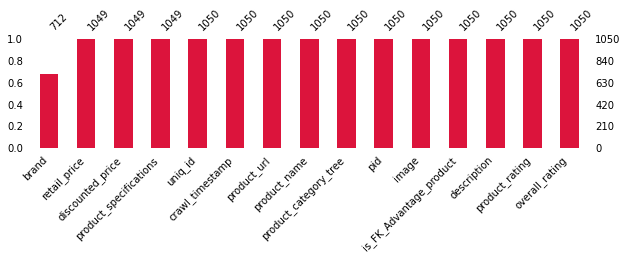

In [6]:
msno.bar(data, figsize=(10,2), fontsize=10, color='crimson', inline=True, sort='ascending')

In [7]:
print('Unique Categories:', data['product_category_tree'].nunique())

Unique Categories: 642


In [8]:
#The product_category_tree columns has various levels of details tabulated by >>.

def cat_levels(cat, lvl):
    cat = cat.split('["')[1].split('"]')[0]
    temp = cat.split(' >> ')
    if(len(temp)) < 3:
        temp = [temp[0], temp[1], 'None']
        if(len(temp))<2:
            temp = [temp[0], 'None', 'None']
    return temp[lvl]

def split_1(cat):
    return cat_levels(cat,0)
def split_2(cat):
    return cat_levels(cat,1)
def split_3(cat):
    return cat_levels(cat,2)

#More than 3 splits is out of range in many cases and we want to avoid creating my columns with NaN.
data['cat_1'] = data['product_category_tree'].apply(split_1)
data['cat_2'] = data['product_category_tree'].apply(split_2)
data['cat_3'] = data['product_category_tree'].apply(split_3)

In [9]:
data.sample(3)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_1,cat_2,cat_3
788,b5aafdb7cfde56f3e9e1364eb1efb691,2015-12-12 11:46:53 +0000,http://www.flipkart.com/perucci-pc-414w-decker-analog-watch-men/p/itme6xu7j5z95yfu?pid=WATE6XU7T4WYMHVQ,Perucci PC-414W Decker Analog Watch - For Men,"[""Watches >> Wrist Watches >> Perucci Wrist Watches""]",WATE6XU7T4WYMHVQ,2100.0,390.0,b5aafdb7cfde56f3e9e1364eb1efb691.jpg,False,"Perucci PC-414W Decker Analog Watch - For Men - Buy Perucci PC-414W Decker Analog Watch - For Men PC-414W Online at Rs.390 in India Only at Flipkart.com. Beautifull Watches, Comfortable Watches, Fancy Watche, Stylish Watches - Great Discounts, Only Genuine Products, 30 Day Replacement Guarantee, Free Shipping. Cash On Delivery!",No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Chronograph"", ""value""=>""No""}, {""key""=>""Altimeter"", ""value""=>""No""}, {""key""=>""Date Display"", ""value""=>""No""}, {""key""=>""Barometer"", ""value""=>""No""}, {""key""=>""Alarm Clock"", ""value""=>""No""}, {""key""=>""Compass"", ""value""=>""No""}, {""key""=>""Calendar"", ""value""=>""No""}, {""key""=>""Luminous"", ""value""=>""No""}, {""key""=>""Mechanism"", ""value""=>""Quartz""}, {""key""=>""Type"", ""value""=>""Analog""}, {""key""=>""Series"", ""value""=>""Decker""}, {""key""=>""Style Code"", ""value""=>""PC-414W""}, {""key""=>""Occasion"", ""value""=>""Casual""}, {""key""=>""Ideal For"", ""value""=>""Men""}, {""key""=>""Novelty Feature"", ""value""=>""Stylish and Awsome watches""}, {""key""=>""Power Source"", ""value""=>""Battery Powered""}, {""value""=>""1 Year Manufacturing Warranty""}, {""key""=>""Dial Shape"", ""value""=>""Round""}, {""key""=>""Strap Color"", ""value""=>""Brown""}, {""key""=>""Strap Design"", ""value""=>""Self Design""}, {""key""=>""Scratch Resistant"", ""value""=>""No""}, {""key""=>""Water Resistant"", ""value""=>""Yes""}, {""key""=>""Clasp Type"", ""value""=>""Buckle""}, {""key""=>""Dial Color"", ""value""=>""White""}, {""value""=>""1 Watch""}]}",Watches,Wrist Watches,Perucci Wrist Watches
308,521528ccaa29dd645e869550cae7a249,2015-12-01 06:13:00 +0000,http://www.flipkart.com/ravishing-variety-statue-showpiece-17-cm/p/itmea6yuy2df7vzw?pid=SHIEA6YUJYA5MF7J,Ravishing Variety Statue Showpiece - 17 cm,"[""Home Decor & Festive Needs >> Showpieces >> Ethnic >> Ravishing Variety Ethnic""]",SHIEA6YUJYA5MF7J,799.0,500.0,521528ccaa29dd645e869550cae7a249.jpg,False,Buy Ravishing Variety Statue Showpiece - 17 cm for Rs.500 online. Ravishing Variety Statue Showpiece - 17 cm at best prices with FREE shipping & cash on delivery. Only Genuine Products. 30 Day Replacement Guarantee.,No rating available,No rating available,Ravishing Variety,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Ravishing Variety""}, {""key""=>""Model Number"", ""value""=>""Rv18""}, {""key""=>""Type"", ""value""=>""Ethnic""}, {""key""=>""Shade"", ""value""=>""Golden""}, {""key""=>""Material"", ""value""=>""Brass""}, {""key""=>""Model Name"", ""value""=>""Statue""}, {""key""=>""Color"", ""value""=>""Gold""}, {""key""=>""Covered in Warranty"", ""value""=>""Warranty of the product is limited to manufacturing defects only.""}, {""key""=>""Warranty Summary"", ""value""=>""No Warranty""}, {""key""=>""Not Covered in Warranty"", ""value""=>""Warranty does not cover any external accessories (such as battery, cable, carrying bag), damage caused to the product due to improper installation by customer, normal wear and tear to magnetic heads, audio, video, laser pick-ups and TV picture tubes, pane""}, {""key""=>""Weight"", ""value""=>""500 g""}, {""key""=>""Height"", ""value""=>""17 cm""}, {""key""=>""Width"", ""value""=>""4 cm""}, {""key""=>""Water Resistant"", ""value""=>""Yes""}, {""key""=>""Wall Mount"", ""value""=>""No""}, {""key""=>""Sales Package"", ""

In [10]:
data.groupby('cat_1').count()['uniq_id'].sort_values(ascending=False)

cat_1
Baby Care                     150
Beauty and Personal Care      150
Computers                     150
Home Decor & Festive Needs    150
Home Furnishing               150
Kitchen & Dining              150
Watches                       150
Name: uniq_id, dtype: int64

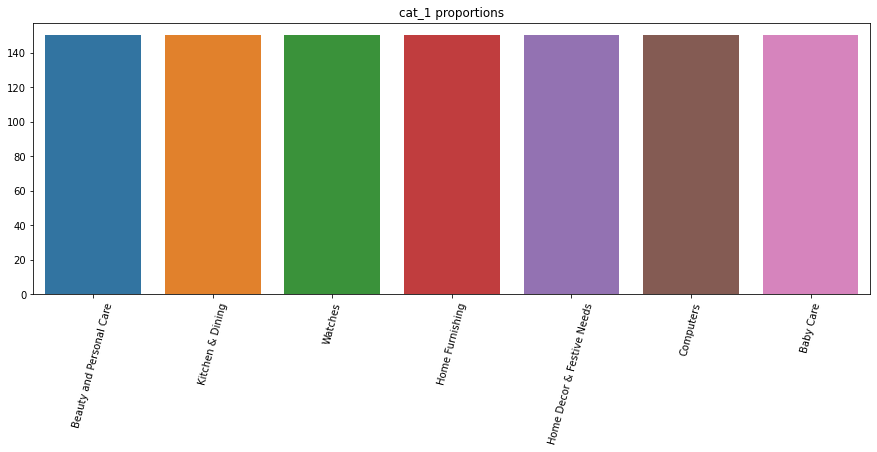

In [11]:
fig = plt.figure(1, figsize=(15, 5))
cat_1 = data['cat_1'].value_counts()
plt.title('cat_1 proportions')
sns.barplot(cat_1.index, cat_1.values)
plt.xticks(rotation=75)
plt.show()

In [12]:
data.groupby('cat_2').count()['uniq_id'].sort_values(ascending=False)

cat_2
Wrist Watches                      149
Laptop Accessories                 87 
Infant Wear                        84 
Coffee Mugs                        74 
Showpieces                         71 
Bed Linen                          65 
Fragrances                         65 
Network Components                 49 
Cookware                           27 
Table Decor & Handicrafts          27 
Combos and Kits                    24 
Wall Decor & Clocks                22 
Bath Linen                         21 
Curtains & Accessories             19 
Makeup                             18 
Baby & Kids Gifts                  15 
Body and Skin Care                 15 
Baby Bedding                       15 
Baby Bath & Skin                   14 
Decorative Lighting & Lamps        14 
Kitchen Tools                      14 
Kitchen & Dining Linen             14 
Containers & Bottles               13 
Cushions, Pillows & Covers         13 
Hair Care                          9  
Feeding & Nursing  

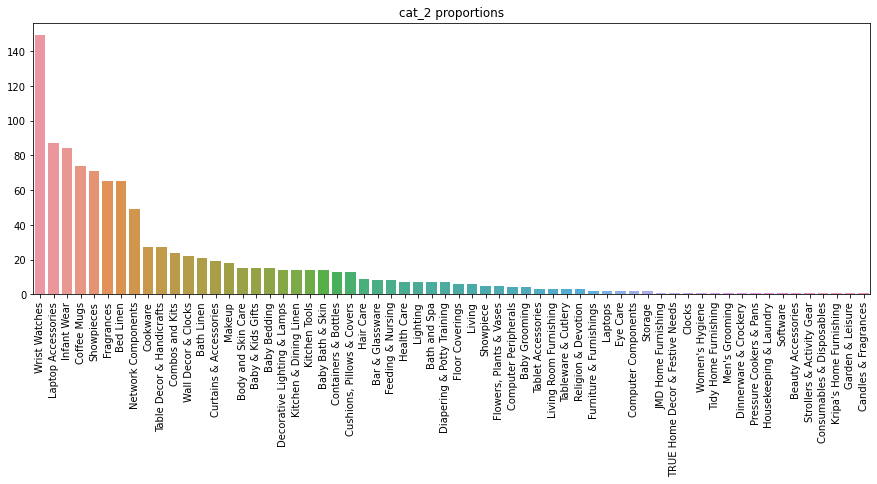

In [13]:
fig = plt.figure(1, figsize=(15, 5))
cat_2 = data['cat_2'].value_counts()
plt.title('cat_2 proportions')
sns.barplot(cat_2.index, cat_2.values)
plt.xticks(rotation=90)
plt.show()

In [14]:
data.groupby('cat_3').count()['uniq_id'].sort_values(ascending=False)

cat_3
Deodorants                                             65
Blankets, Quilts & Dohars                              57
Baby Girls' Clothes                                    49
Routers                                                49
USB Gadgets                                            38
Baby Boys' Clothes                                     35
Ethnic                                                 34
Prithish Coffee Mugs                                   26
Pots & Pans                                            24
Maxima Wrist Watches                                   23
Showpieces                                             23
Rockmantra Coffee Mugs                                 22
Batteries                                              22
Sonata Wrist Watches                                   19
Curtains                                               19
Towels                                                 19
Printland Coffee Mugs                                  13
Kitchen 

In [15]:
data.to_csv('data_save/data.csv')

Nous nous en tiendrons à **cat_1** car il est le plus uniformément distribué.

# Préparation des données

## Text data

Afin d'utiliser ces données pour l'apprentissage automatique, nous devons être en mesure de convertir le contenu de chaque chaîne en un vecteur de nombres.

In [16]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(data, test_size=0.25, random_state=42)

train.to_csv('data_save/train.csv')
test.to_csv('data_save/test.csv')

In [17]:
print(train.shape)
print(test.shape)

(787, 18)
(263, 18)


In [18]:
train[['description']].sample(3)

,description
687,"Flipkart.com: Buy Jovees Anjeer & Carrot Sunblock (Pack of 2) - SPF 45 for Rs. 0.0 from Flipkart.com. - Lowest Prices, Only Genuine Products, 30 Day Replacement Guarantee, Free Shipping. Cash On Delivery!"
643,"Specifications of Intel 3.2 GHz LGA 1150 3250 Processor (BLACK) In The Box Sales Package Intel Dual Core Processor Memory Maximum Memory Size Supported 32 GB Memory Type Supported DDR3-1333, DDR3L-1333 @ 1.5V General Speed 3.2 GHz with Maximum Turbo Speed of3.2 GHz Maximum Thermal Design Power [TDP] 53 W Number of Threads 2 Threads Number of Cores 2 Cores Warranty Covered in Warranty WARRANTY Warranty Summary 3 years Service Type ON SITE Not Covered in Warranty Damage Graphics Base Frequency 350 MHz Integrated Graphics Yes General Features Brand Intel Architecture 64-bit Model ID 3250 Socket Type LGA 1150"
21,"Now SP-ETHNIC Analog Watch - For Boys - Buy Now SP-ETHNIC Analog Watch - For Boys SP-ETHNIC Online at Rs.600 in India Only at Flipkart.com. - Great Discounts, Only Genuine Products, 30 Day Replacement Guarantee, Free Shipping. Cash On Delivery!"


Le stemming est différente de la lemmatisation dans l'approche qu'elle utilise pour produire des formes racines de mots et le mot produit. Les deux méthodes sont largement utilisées dans les systèmes de tagging, l'indexation, les SEO, les résultats de recherche web et la recherche d'informations.

Le stemming est le processus de réduction de l'inflexion des mots à leur forme racine (stem), comme le mappage d'un groupe de mots sur la même racine, même si la racine elle-même n'est pas un mot valide dans la langue. Donc, la racine est la partie du mot à laquelle vous ajoutez des affixes flexionnels (changement / dérivation) tels que : -ed, -ize, -s, -de et -mis (en anglais).

La lemmatisation, contrairement au stemming, réduit correctement les mots fléchis en s'assurant que le mot racine appartient à la langue. Dans la lemmatisation, le mot racine est appelé Lemme. Un lemme (pluriel : lemmata) est la forme canonique, la forme du dictionnaire ou la forme de citation d'un ensemble de mots. Par exemple (en anglais) : *runs, running and ran* sont toutes les formes du mot *run*, donc *run* est le lemme de tous ces mots. Comme la lemmatisation renvoie un mot réel de la langue, elle est utilisée là où il est nécessaire d'obtenir des mots valides.

### Fonctions à utiliser

In [19]:
import nltk
from string import punctuation

stopW_nltk = set(nltk.corpus.stopwords.words('english'))
stopW_punct = set(punctuation)
stopW_list = set.union(stopW_nltk, stopW_punct)

In [20]:
from nltk import word_tokenize          
from nltk.stem import WordNetLemmatizer

class LemmaTokenizer(object):
    def __init__(self):
        self.wnl = WordNetLemmatizer()
    def __call__(self, articles):
        return [self.wnl.lemmatize(t) for t in word_tokenize(articles)]

In [21]:
from sklearn.decomposition import PCA

#PCA reduction
def pca_function(to_fit):
    pca = PCA(n_components=0.8, #80% cumulated variance
              random_state=0,
             ).fit(to_fit)
    x = pca.transform(to_fit)
    print(x.shape, end='\n\n')
    return pca, x

def pca_graph(pca):
    cum_var = pca.explained_variance_ratio_*100 #percentage
    plt.figure(figsize=(12,5))
    plt.plot(np.arange(len(cum_var))+1, np.cumsum(cum_var))
    plt.title('Somme cumulée de variance des composantes du PCA : 80%')
    plt.xlabel('Nombre de composantes du PCA')
    plt.ylabel('Variance cumulée (%)')
    plt.axhline(80, lw=1, c='red')
    plt.text(1, 80, '80%', c='red')
    plt.show()

In [22]:
from sklearn.manifold import TSNE

dict_tsne_results = {} #TSNE results dictionary

#T-SNE for visualization
def tsne_function(x):
    tsne = TSNE(n_components=2,
                perplexity=30, #30
                init='pca',
                random_state=0,
                n_iter=1000,
                n_jobs=-1,
               )
    tsne_result = tsne.fit_transform(x)
    return tsne_result

In [23]:
from sklearn.cluster import KMeans
from sklearn.metrics.cluster import adjusted_rand_score

ari_df = {}
dict_y_train = {}

#K-Means clustering
def kmeans_function(tsne_result, df, nc=data['cat_1'].nunique()):
    kmeans = KMeans(n_clusters=nc, 
                init='k-means++', 
                verbose=0,
                random_state=0,
                n_jobs=-1,
               ).fit(tsne_result)

    y_train = kmeans.labels_ #predicted value
    result = adjusted_rand_score(df['cat_1'], kmeans.labels_)
    return result, y_train, kmeans

In [24]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score

#Data visualization Train vs Test
def tsne_visualization(tsne_result, y_train, y_test, df, nc=data['cat_1'].nunique()):
    
    X_normalized = MinMaxScaler().fit_transform(tsne_result)
    
    fig = plt.figure(1, figsize=(20, 10))
    plt.title('TSNE visualization', fontweight='bold')
    
    cat_looper = np.unique(y_test)
    cat_looper_predicted = np.unique(y_train)

    plt.subplot(1, 2, 1)
    plt.title('Train set')
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    
    for c in cat_looper:
        sns.scatterplot(X_normalized[y_test == c, 0],
                        X_normalized[y_test == c, 1],
                        label=c, 
                        palette=sns.color_palette("hls", nc),
                       )

    plt.subplot(1, 2, 2)
    plt.title('Predicted set')
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    
    for c in cat_looper_predicted:
        sns.scatterplot(X_normalized[y_train == c, 0],
                        X_normalized[y_train == c, 1],
                        label=c, 
                        palette=sns.color_palette("hls", nc),
                       )
        
    plt.show()

In [25]:
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix

# Une matrice de confusion, est une disposition de table spécifique qui permet de 
# visualiser les performances d'un algorithme. Chaque ligne de la matrice représente les instances 
# d'une classe réelle tandis que chaque colonne représente les instances d'une classe 
# prédite, ou vice versa. Le nom vient du fait qu'il permet de voir facilement si le 
# système confond deux classes (c'est-à-dire : mal étiquetées l'une comme l'autre).
# Il s'agit d'un type spécial de tableau de contingence, avec deux dimensions ("réelle" 
# et "prédite"), et des ensembles identiques de "classes" dans les deux dimensions 
# (chaque combinaison de dimension et de classe est une variable dans le tableau de 
# contingence).

def graph_conf_matrix(y_train, data=data, dict_y_train=None):
    category_encoder = LabelEncoder()

    y_test = category_encoder.fit_transform(data['cat_1'])
    
    if dict_y_train is not None:
        y_train = dict_y_train['BOW']

    mat = confusion_matrix(y_test, y_train)
    sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
                xticklabels=data['cat_1'].unique().tolist(), yticklabels=data['cat_1'].unique().tolist())
    plt.xlabel('true label')
    plt.ylabel('predicted label')
    plt.show()

In [26]:
example = train['description'].iloc[3]

print('Original form')
print(example, end='\n\n')

example = example.lower()
print('Lowercase')
print(example, end='\n\n')

example = word_tokenize(example)
print('Tokenize')
print(example, end='\n\n')

example = [word for word in example if not word in stopW_list]
print('Stopwords')
print(example, end='\n\n')

lemmatizer_example = WordNetLemmatizer()
example = [lemmatizer_example.lemmatize(e) for e in example]
print('Lemmatizer')
print(example, end='\n\n')

Original form
Flipkart.com: Buy Richfeel Sunshield - SPF 30 PA++ for Rs. 269 from Flipkart.com. - Lowest Prices, Only Genuine Products, 30 Day Replacement Guarantee, Free Shipping. Cash On Delivery!

Lowercase
flipkart.com: buy richfeel sunshield - spf 30 pa++ for rs. 269 from flipkart.com. - lowest prices, only genuine products, 30 day replacement guarantee, free shipping. cash on delivery!

Tokenize
['flipkart.com', ':', 'buy', 'richfeel', 'sunshield', '-', 'spf', '30', 'pa++', 'for', 'rs', '.', '269', 'from', 'flipkart.com', '.', '-', 'lowest', 'prices', ',', 'only', 'genuine', 'products', ',', '30', 'day', 'replacement', 'guarantee', ',', 'free', 'shipping', '.', 'cash', 'on', 'delivery', '!']

Stopwords
['flipkart.com', 'buy', 'richfeel', 'sunshield', 'spf', '30', 'pa++', 'rs', '269', 'flipkart.com', 'lowest', 'prices', 'genuine', 'products', '30', 'day', 'replacement', 'guarantee', 'free', 'shipping', 'cash', 'delivery']

Lemmatizer
['flipkart.com', 'buy', 'richfeel', 'sunshield'

### Bag of words (BOW)

La méthode BOW consiste à créer un dataframe avec des colonnes pour chaque mot différent présent dans le corpus (l'ensemble des descriptions dans la colonne **description**) et d'indiquer le nombre de fois qu'il apparait dans chaque description de chaque article. Donc, nous créons un histogramme de l'apparition des mots dans l'ensemble des descriptions.

In [27]:
from sklearn.feature_extraction.text import CountVectorizer
 
bow_vectorizer = CountVectorizer(tokenizer=LemmaTokenizer(),
                                 encoding='utf-8',
                                 strip_accents='unicode', 
                                 stop_words=stopW_list,
                                 lowercase=True,
                                 analyzer='word',
                                 min_df=5,
                                )

bow_ft = bow_vectorizer.fit_transform(data['description'].astype('U'))
bow_df = pd.DataFrame(bow_ft.toarray(),columns=bow_vectorizer.get_feature_names())
print(bow_df.shape)
bow_df.head(3)

(1050, 1060)


,'','re,'s,..,...,0,0.0,1,"1,499","1,799",10,100,11,12,121,1299,13,14,14.1,1499,15,15.6,150,152,16,17,170,175,18,180,19,19.5,19.5v,"19.5v,3.9a",199,2,2.5,20,200,220,225,228,23,230,24,250,259,28,299,3,3.5,3.9,3.95a,3.9a,30,300,300ml,310,32,329,33,330,349,350,360,399,3d,4,4.4.,4.4mm,4.5,40,400,449,45,499,5,5.5,50,500,549,59,599,6,6.5,6.5mm,60,649,65,69,699,7,7.5,70,75,75w,8,80,800,899,9,9.5,90,900,95,999,``,a-line,absorbent,abstract,ac,accessory,actual,adapter,add,addition,additional,adidas,adjustable,adorable,affordable,age,air,akup,alarm,almond,aloevera,along,also,aluminium,always,amazing,analog,andre,android,animal,anna,another,antique,apparel,appeal,appearance,apple,application,applied,apply,area,aroma,around,art,artificial,artisan,artist,artistic,assorted,assure,assured,asus,attitude,attractive,audio,authentication,available,away,awesome,baby,back,bag,bank,base,based,basic,bath,battery,beautiful,beautifull,beautifully,beauty,bed,bedroom,bedsheet,beige,belt,best,better,big,birthday,black,blade,blanket,bleach,blend,blue,body,bodysuit,bottle,bottom,bowl,box,boy,brand,branded,brass,break,bright,bring,brings,broadcast,brown,brush,bubble,buckle,buddha,bulb,business,button,buy,c,cable,canvas,cap,capacity,card,care,carpet,carry,carrying,cartoon,carved,case,cash,casual,catchy,category,caused,ce,cell,center,ceramic,certification,charge,charger,check,checkered,cheer,child,chinese,choice,christmas,chronograph,clasp,classic,clay,clean,clear,clock,closure,cloth,clothes,cm,co,coating,code,coffee,coffee/tea,cold,collection,color,colour,coloured,combination,combo,come,comfort,comfortable,comforter,compact,company,compatible,complete,compliance,compromise,condition,conditioner,conforms,connect,connector,consumption,contact,container,contemporary,content,control,convenient,cool,copper,cord,core,cotton,cover,covered,craft,crafted,crafting,craftsman,cream,create,creation,cupcake,current,curtain,cushion,customer,cut,cute,cutter,daily,damage,damaged,dark,day,decal,decker,decor,decorate,decoration,decorative,deep,defect,delivery,denver,deodorant,deployment,depth,design,designed,designer,desk,detail,detergent,deviation,device,dial,diameter,diaper,different,digital,dimension,dining,dirt,disclaimer,discount,dishwasher,display,displayed,disposable,distinctive,doe,dohar,door,double,drawer,dress,drive,dry,dual,due,durability,durable,dust,duvet,ease,easily,easy,edimax,effect,elastic,elegance,elegant,elephant,embroidered,energy,enhance,enhances,enjoy,enjoyment,ensure,ensures,ensuring,essential,etc,even,every,excellent,exchange,exclusive,exotic,experience,express,exquisite,extender,external,extra,eye,eyelet,f,fabric,face,factory,family,famous,fan,fancy,fantastic,fashion,favorite,feature,feel,fengshui,figurine,filling,find,fine,finest,finish,finished,fire,first,fit,fitted,flat,flexible,flipkart,flipkart.com,floral,flower,food,forever,forget,form,formal,four,frame,free,freedom,freezer,fresh,friend,frock,front,fruit,full,function,furnishing,g,ganesha,garment,gathered,gb,gel,general,gentle,gently,genuine,geometric,get,getting,gift,gifting,girl,give,glass,glossy,glove,glow,glue,go,gold,golden,good,grade,graphic,great,green,grey,group,gsm,guarantee,guest,gum,ha,hair,half,hand,handcrafted,handicraft,handle,handmade,hanging,happiness,happy,hard,harness,haveli,head,health,heat,heavy,height,help,high,highest,holder,holiday,home,honey,hook,hot,hour,house,however,hp,hub,huge,hz,ice,id,ideal,idol,image,important,improper,inch,included,including,india,indian,indicative,ink,inner,input,inside,install,installation,instruction,intellect,intense,interior,international,iron,item,jaipur,jasmine,jewellery,kadhai,keep,key,keyboard,kg,kid,kind,kindly,king,kit,kitchen,klub,know,known,krishna,l,label,lal,lamination,lamp,lapguard,laptop,large,laser,lasting,latest,laugh,layer,leading,leaf,leave,leaving,led,lemon,length,let,level,lid,life,light,lighting,lightweight,like,limited,line,linen,lining,lip,lipstick,liquid,little,living,long,look,looking,loop,lord,lotion,love,loved,lovely,lo

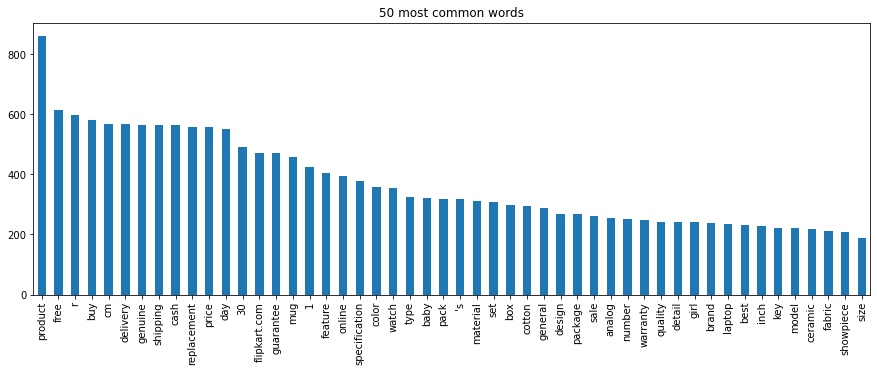

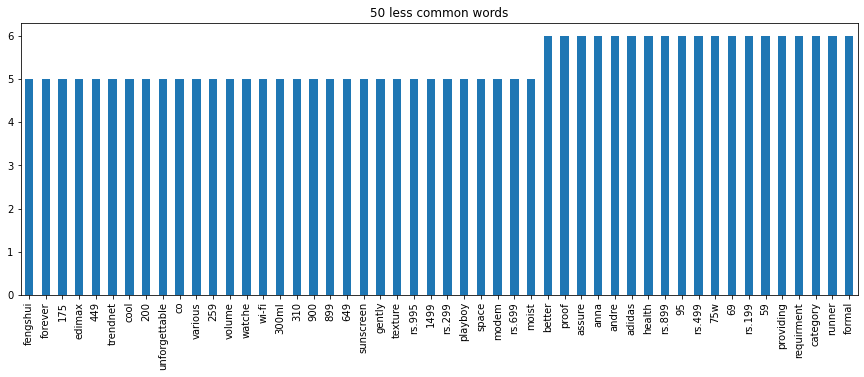

In [28]:
plt.title('50 most common words')
bow_df.sum(axis=0).sort_values(ascending=False)[:50].plot.bar(figsize=(15,5))
plt.show()

plt.title('50 less common words')
bow_df.sum(axis=0).sort_values(ascending=True)[:50].plot.bar(figsize=(15,5))
plt.show()

(1050, 82)



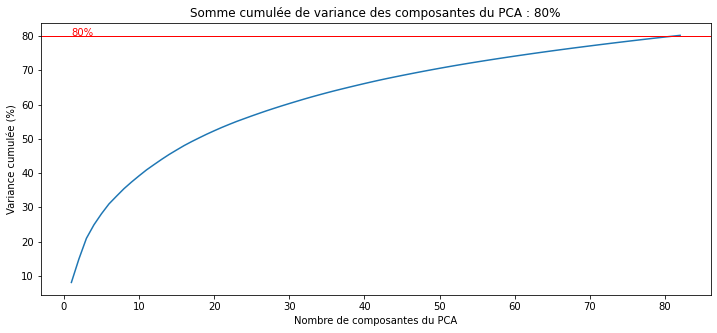

Adjusted Rand Index = 0.3865478551702705


In [29]:
pca, x = pca_function(bow_df)
pca_graph(pca)

tsne_result = tsne_function(x)
dict_tsne_results['BOW'] = tsne_result

result, y_train, kmeans_model = kmeans_function(tsne_result, data)
ari_df['BOW'] = result
dict_y_train['BOW'] = y_train
print('Adjusted Rand Index = {}'.format(result))

y_test = data['cat_1'].values

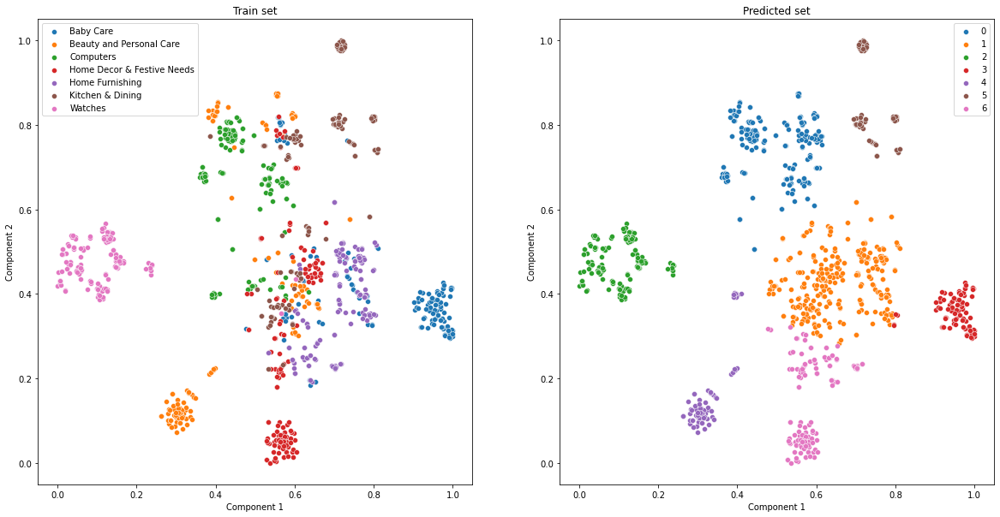

In [30]:
tsne_visualization(tsne_result, y_train, y_test, data)

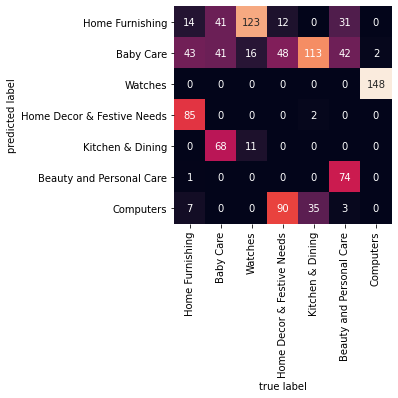

In [31]:
graph_conf_matrix(y_train, data)

### TF-IDF

Le Term frequency-inverse document frequency (TF-IDF) est un modèle qui pondère les mots compte par une mesure de la fréquence à laquelle elles apparaissent dans le corpus. Il s'agit d'un statistique numérique destiné à refléter l'importance d'un mot ; c'est comme un facteur de pondération.

La valeur TF-IDF augmente proportionnellement au nombre de fois qu'un mot apparaît dans le corpus et est compensée par le nombre de documents dans le corpus qui contiennent le mot, ce qui permet d'ajuster le fait que certains mots apparaissent plus fréquemment en général.

In [32]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vectorizer = TfidfVectorizer(tokenizer=LemmaTokenizer(),
                                   encoding='utf-8',
                                   strip_accents='unicode', 
                                   stop_words=stopW_list,
                                   lowercase=True,
                                   min_df=5,
                                  )
tfidf_ft = tfidf_vectorizer.fit_transform(data['description'].astype('U'))
tfidf_df = pd.DataFrame(tfidf_ft.toarray(), columns=tfidf_vectorizer.get_feature_names())
print(tfidf_df.shape)
tfidf_df.head(3)

(1050, 1060)


,'','re,'s,..,...,0,0.0,1,"1,499","1,799",10,100,11,12,121,1299,13,14,14.1,1499,15,15.6,150,152,16,17,170,175,18,180,19,19.5,19.5v,"19.5v,3.9a",199,2,2.5,20,200,220,225,228,23,230,24,250,259,28,299,3,3.5,3.9,3.95a,3.9a,30,300,300ml,310,32,329,33,330,349,350,360,399,3d,4,4.4.,4.4mm,4.5,40,400,449,45,499,5,5.5,50,500,549,59,599,6,6.5,6.5mm,60,649,65,69,699,7,7.5,70,75,75w,8,80,800,899,9,9.5,90,900,95,999,``,a-line,absorbent,abstract,ac,accessory,actual,adapter,add,addition,additional,adidas,adjustable,adorable,affordable,age,air,akup,alarm,almond,aloevera,along,also,aluminium,always,amazing,analog,andre,android,animal,anna,another,antique,apparel,appeal,appearance,apple,application,applied,apply,area,aroma,around,art,artificial,artisan,artist,artistic,assorted,assure,assured,asus,attitude,attractive,audio,authentication,available,away,awesome,baby,back,bag,bank,base,based,basic,bath,battery,beautiful,beautifull,beautifully,beauty,bed,bedroom,bedsheet,beige,belt,best,better,big,birthday,black,blade,blanket,bleach,blend,blue,body,bodysuit,bottle,bottom,bowl,box,boy,brand,branded,brass,break,bright,bring,brings,broadcast,brown,brush,bubble,buckle,buddha,bulb,business,button,buy,c,cable,canvas,cap,capacity,card,care,carpet,carry,carrying,cartoon,carved,case,cash,casual,catchy,category,caused,ce,cell,center,ceramic,certification,charge,charger,check,checkered,cheer,child,chinese,choice,christmas,chronograph,clasp,classic,clay,clean,clear,clock,closure,cloth,clothes,cm,co,coating,code,coffee,coffee/tea,cold,collection,color,colour,coloured,combination,combo,come,comfort,comfortable,comforter,compact,company,compatible,complete,compliance,compromise,condition,conditioner,conforms,connect,connector,consumption,contact,container,contemporary,content,control,convenient,cool,copper,cord,core,cotton,cover,covered,craft,crafted,crafting,craftsman,cream,create,creation,cupcake,current,curtain,cushion,customer,cut,cute,cutter,daily,damage,damaged,dark,day,decal,decker,decor,decorate,decoration,decorative,deep,defect,delivery,denver,deodorant,deployment,depth,design,designed,designer,desk,detail,detergent,deviation,device,dial,diameter,diaper,different,digital,dimension,dining,dirt,disclaimer,discount,dishwasher,display,displayed,disposable,distinctive,doe,dohar,door,double,drawer,dress,drive,dry,dual,due,durability,durable,dust,duvet,ease,easily,easy,edimax,effect,elastic,elegance,elegant,elephant,embroidered,energy,enhance,enhances,enjoy,enjoyment,ensure,ensures,ensuring,essential,etc,even,every,excellent,exchange,exclusive,exotic,experience,express,exquisite,extender,external,extra,eye,eyelet,f,fabric,face,factory,family,famous,fan,fancy,fantastic,fashion,favorite,feature,feel,fengshui,figurine,filling,find,fine,finest,finish,finished,fire,first,fit,fitted,flat,flexible,flipkart,flipkart.com,floral,flower,food,forever,forget,form,formal,four,frame,free,freedom,freezer,fresh,friend,frock,front,fruit,full,function,furnishing,g,ganesha,garment,gathered,gb,gel,general,gentle,gently,genuine,geometric,get,getting,gift,gifting,girl,give,glass,glossy,glove,glow,glue,go,gold,golden,good,grade,graphic,great,green,grey,group,gsm,guarantee,guest,gum,ha,hair,half,hand,handcrafted,handicraft,handle,handmade,hanging,happiness,happy,hard,harness,haveli,head,health,heat,heavy,height,help,high,highest,holder,holiday,home,honey,hook,hot,hour,house,however,hp,hub,huge,hz,ice,id,ideal,idol,image,important,improper,inch,included,including,india,indian,indicative,ink,inner,input,inside,install,installation,instruction,intellect,intense,interior,international,iron,item,jaipur,jasmine,jewellery,kadhai,keep,key,keyboard,kg,kid,kind,kindly,king,kit,kitchen,klub,know,known,krishna,l,label,lal,lamination,lamp,lapguard,laptop,large,laser,lasting,latest,laugh,layer,leading,leaf,leave,leaving,led,lemon,length,let,level,lid,life,light,lighting,lightweight,like,limited,line,linen,lining,lip,lipstick,liquid,little,living,long,look,looking,loop,lord,lotion,love,loved,lovely,lo

(1050, 174)



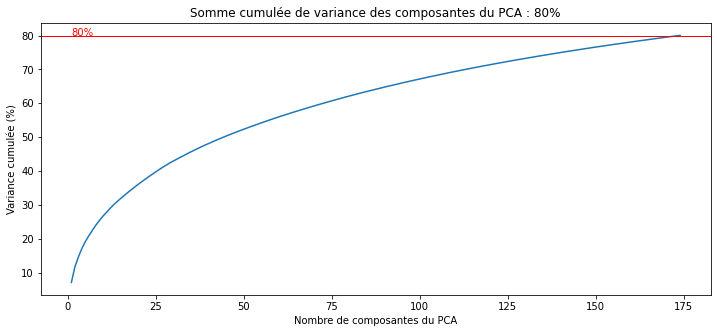

Adjusted Rand Index = 0.41724693401838064


In [33]:
pca, x = pca_function(tfidf_df)
pca_graph(pca)

tsne_result = tsne_function(x)
dict_tsne_results['TFIDF'] = tsne_result

result, y_train, kmeans_model = kmeans_function(tsne_result, data)
ari_df['TFIDF'] = result
dict_y_train['TFIDF'] = y_train
print('Adjusted Rand Index = {}'.format(result))

y_test = data['cat_1'].values

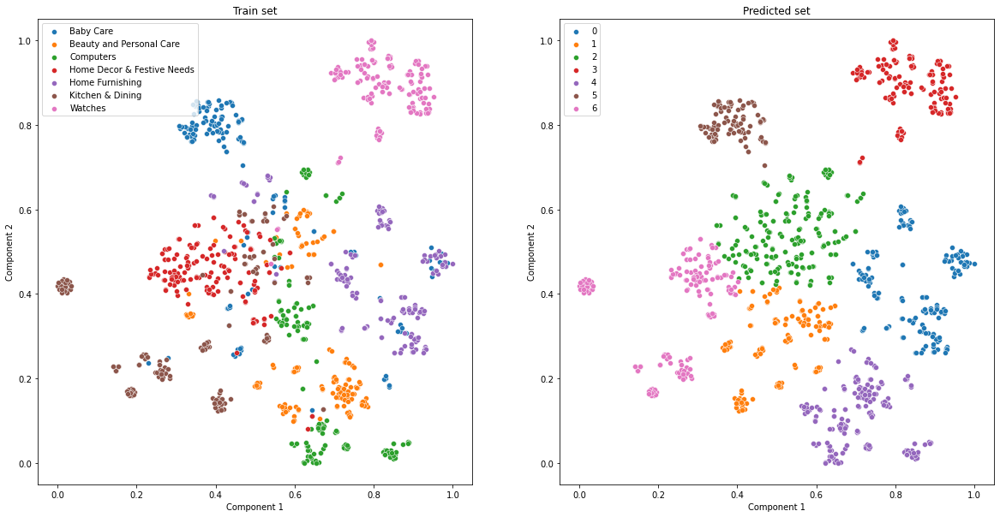

In [34]:
tsne_visualization(tsne_result, y_train, y_test, data)

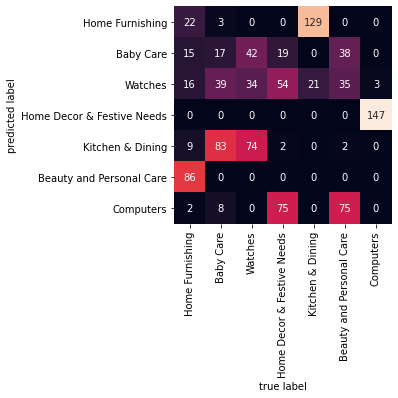

In [35]:
graph_conf_matrix(y_train, data)

### BOW + LDA

Dans le traitement du langage naturel, la Latent Dirichlet Allocation (LDA) est un modèle statistique génératif (modèle qui cherche à décrire chaque classe et à en déduire à quel point une donnée présente les caractéristiques de cette classe) qui permet d'expliquer certaines parties d'observations par des groupes non observés qui expliquent pourquoi certaines parties des données sont similaires.

Par exemple, si les observations sont des mots rassemblés dans des documents, cela suppose que chaque document est un mélange d'un petit nombre de sujets (Topics) et que la présence de chaque mot est attribuable à l'un des sujets du document.

In [36]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.pipeline import make_pipeline

lda = LatentDirichletAllocation(n_components=data['cat_1'].nunique(), #full number of variables
                                learning_method='online',
                                max_iter=10, #default
                                learning_offset=50.,
                                n_jobs=-1,
                                random_state=0,
                               )

bow_lda_model = make_pipeline(bow_vectorizer, lda)
lda_ft = bow_lda_model.fit_transform(data['description'].astype('U'))
print(lda_ft.shape)

(1050, 7)


In [37]:
cv = bow_vectorizer.fit_transform(data['description'].astype('U'))
lda.fit(cv)
cv_feature_names = bow_vectorizer.get_feature_names()

In [38]:
#From OCR course
def display_topics(model, feature_names, no_top_words=10):
    for topic_idx, topic in enumerate(model.components_):
        s1 = 'Topic {}: '.format(topic_idx)
        s1 += ' '.join([feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]])
        print(s1)

In [39]:
display_topics(lda, cv_feature_names)

Topic 0: mug ceramic perfect '' coffee gift one design material safe
Topic 1: baby 's cotton girl fabric detail 1 specification boy ideal
Topic 2: adapter battery laptop warranty replacement power product quality charger vaio
Topic 3: home showpiece price art brass bowl r product gift quality
Topic 4: skin laptop print shape mouse pad combo set multicolor warranty
Topic 5: free delivery cash shipping genuine buy product 30 day guarantee
Topic 6: cm feature 1 color pack model design material box type


In [40]:
tsne_result = tsne_function(lda_ft)
dict_tsne_results['LDA'] = tsne_result

result, y_train, kmeans_model = kmeans_function(tsne_result, data)
ari_df['LDA'] = result
dict_y_train['LDA'] = y_train
print('Adjusted Rand Index = {}'.format(result))

y_test = data['cat_1'].values

Adjusted Rand Index = 0.18066319913222806


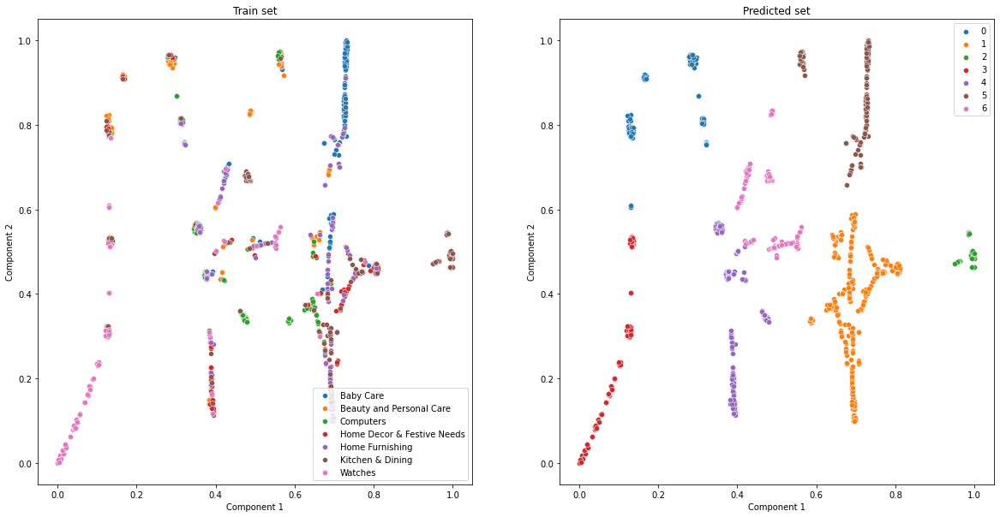

In [41]:
tsne_visualization(tsne_result, y_train, y_test, data)

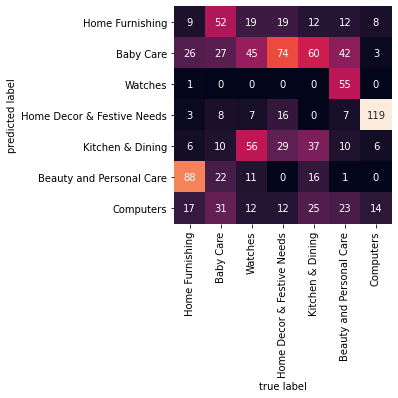

In [42]:
graph_conf_matrix(y_train, data)

### TF-IDF + NMF

La Non-Negative Matrix Factorization (NMF ou NNMF) est un groupe d'algorithmes d'analyse multivariée et d'algèbre linéaire où une matrice V est factorisée en (généralement) deux matrices W et H, avec la propriété que les trois les matrices n'ont pas d'éléments négatifs. Cette non-négativité rend les matrices résultantes plus faciles à inspecter. Aussi, dans des certains applications, la non-négativité est inhérente aux données considérées. Étant donné que le problème n'est pas exactement résoluble en général, il est généralement approché numériquement.

In [43]:
from sklearn.decomposition import NMF

nmf = NMF(n_components=data['cat_1'].nunique(), #full number of variables, 
          random_state=0, 
          alpha=.1, 
          l1_ratio=.5, 
          init='nndsvd',
         )

tfidf_nmf_model = make_pipeline(tfidf_vectorizer, nmf)
nmf_ft = tfidf_nmf_model.fit_transform(data['description'].astype('U'))
print(nmf_ft.shape)

(1050, 7)


In [44]:
tf = tfidf_vectorizer.fit_transform(data['description'].astype('U'))
nmf.fit(tf)
tf_feature_names = tfidf_vectorizer.get_feature_names()

In [45]:
display_topics(nmf, tf_feature_names)

Topic 0: flipkart.com genuine shipping cash delivery buy free product r 30
Topic 1: watch analog men discount india great woman online flipkart.com guarantee
Topic 2: baby 's girl detail fabric dress cotton boy sleeve neck
Topic 3: mug ceramic '' perfect rockmantra one coffee gift loved safe
Topic 4: showpiece cm best online price guarantee 30 replacement day cash
Topic 5: cm 1 pack warranty color inch feature model box number
Topic 6: flipkart.com combo set online guarantee 30 replacement day cash shipping


In [46]:
tsne_result = tsne_function(nmf_ft)
dict_tsne_results['NMF'] = tsne_result

result, y_train, kmeans_model = kmeans_function(tsne_result, data)
ari_df['NMF'] = result
dict_y_train['NMF'] = y_train
print('Adjusted Rand Index = {}'.format(result))

y_test = data['cat_1'].values

Adjusted Rand Index = 0.29731739970275806


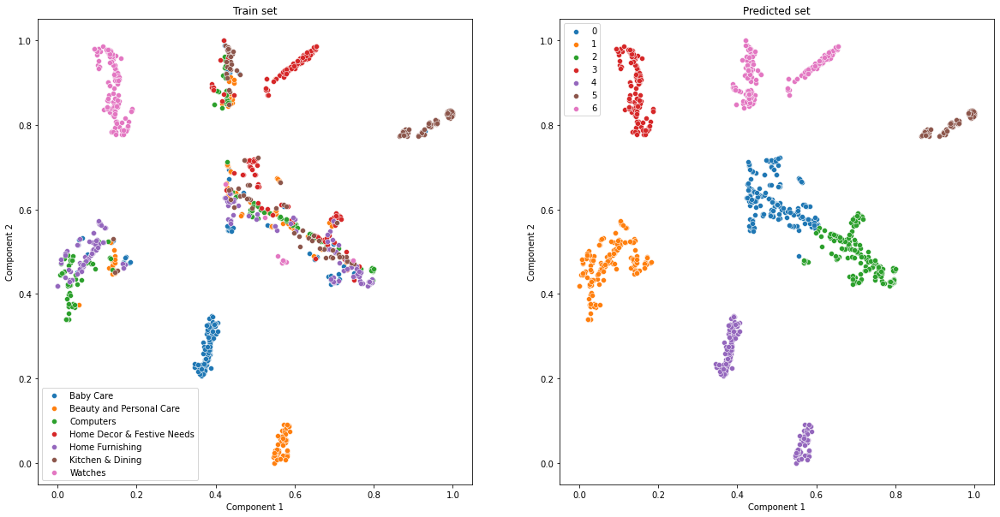

In [47]:
tsne_visualization(tsne_result, y_train, y_test, data)

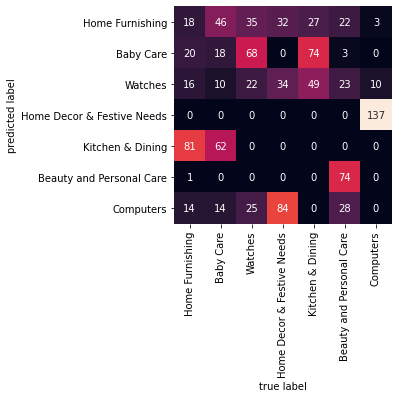

In [48]:
graph_conf_matrix(y_train, data)

### ARI

Les valeurs de sortie ARI (Ajusted Rand Index) sont comprises entre -1 et 1. Un score proche de 0 indique des affectations aléatoires et un score proche de 1 indique des clusters parfaitement étiquetés. Sur la base de la sortie ci-dessous, nous pouvons voir que les méthodes testées étaient trompeuses.

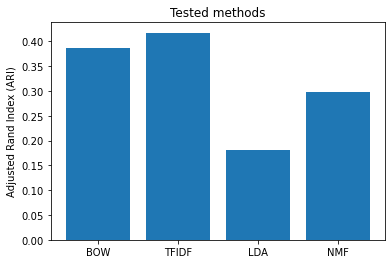

In [49]:
g = plt.bar(range(len(ari_df)), list(ari_df.values()))
plt.xticks(range(len(ari_df)), list(ari_df.keys()))
plt.ylabel('Adjusted Rand Index (ARI)')
plt.title('Tested methods')
plt.show()

### Non supervised classifiers : Multinomial Naïve Bayes

#### TF-IDF + MNB

Naïve Bayes utilise le théorème de Bayes combiné à une présomption ("naïve") d'indépendance conditionnelle pour prédire la valeur d'une cible (sortie / output) à partir des preuves fournies par un ou plusieurs champs prédicteurs (d'entrée / input). La technique Naïve Bayes Classifier est basée sur le théorème bayésien.

In [50]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import make_pipeline
from sklearn.metrics import accuracy_score

acc_df = {}

model = make_pipeline(tfidf_vectorizer, MultinomialNB())
model.fit(train['description'], train['cat_1']) #data x_train, target y_train
predictions = model.predict(test['description']) #y_test = predict(x_test)

acc = accuracy_score(predictions, test['cat_1'])
acc_df['TFIDF_MNB'] = acc

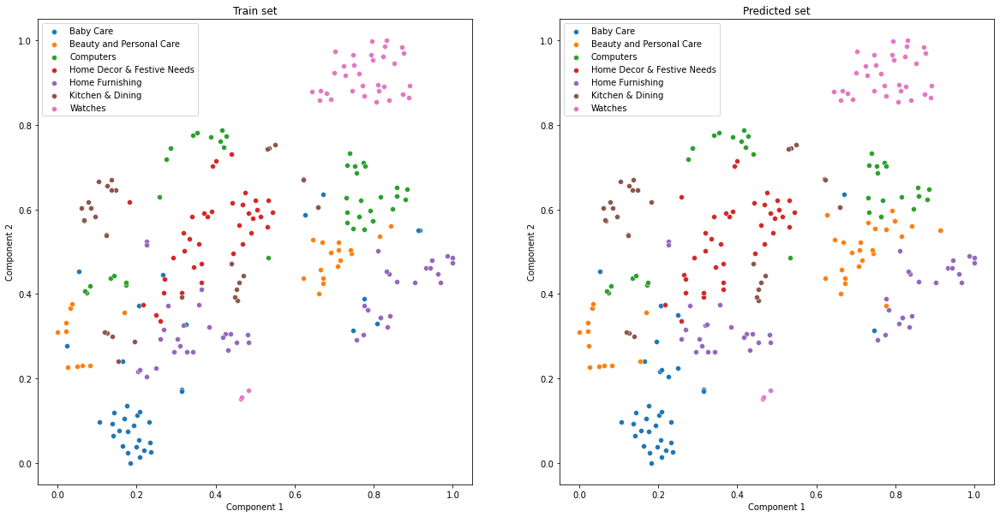

In [51]:
tfidf_mnb_ft = tfidf_vectorizer.fit_transform(test['description'].astype('U'))
tfidf_mnb_df = pd.DataFrame(tfidf_mnb_ft.toarray(), columns=tfidf_vectorizer.get_feature_names())

tfidf_mnb_tsne_result = tsne_function(tfidf_mnb_df)
tsne_visualization(tfidf_mnb_tsne_result, predictions, test['cat_1'].values, test)

In [52]:
from sklearn.metrics import confusion_matrix

def nonSup_graph_conf_matrix(test, train, predictions, acc=None):
    mat = confusion_matrix(test['cat_1'], predictions) #true value vs prediction
    sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
                xticklabels=train['cat_1'].unique().tolist(), yticklabels=train['cat_1'].unique().tolist())
    plt.xlabel('true label')
    plt.ylabel('predicted label')
    plt.show()
    
    if acc is not None:
        print('Accuracy: {}'.format(acc))

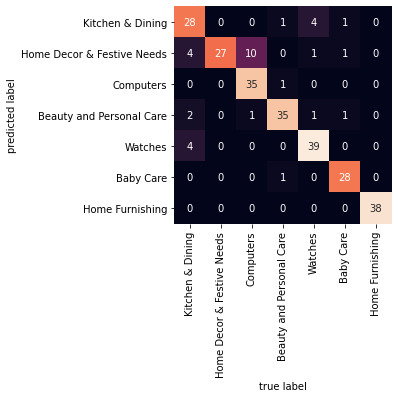

Accuracy: 0.8745247148288974


In [53]:
nonSup_graph_conf_matrix(test, train, predictions, acc)

Le modèle se confond entre "Computers" et "Home decor & Festive Needs". S'agit-il d'une zone de confusion attendue ?

In [54]:
category_encoder = LabelEncoder()
y_pred = category_encoder.fit_transform(predictions)
ari_df['TFIDF_MNB'] = adjusted_rand_score(test['cat_1'], y_pred)
print('Adjusted Rand Index: {}'.format(ari_df['TFIDF_MNB']))

Adjusted Rand Index: 0.7360062487438397


L'ARI de la méthode TF-IDF + MNB est meilleure que les ARI des méthodes testées précédemment.

## Visual data

In [55]:
from IPython.display import Image
from PIL import Image as Image_PIL
from PIL import ImageFilter

#Test sample
img_sample = data.sample(1, random_state=2)
img_sample['image'] = img_sample['image'].apply(lambda x: 'Flipkart/Images/'+str(x))
#Random image from the img_sample dataframe
url = img_sample.iloc[0]['image']

### Test methods

#### Preprocessing

In [56]:
import cv2
import keras

Using TensorFlow backend.


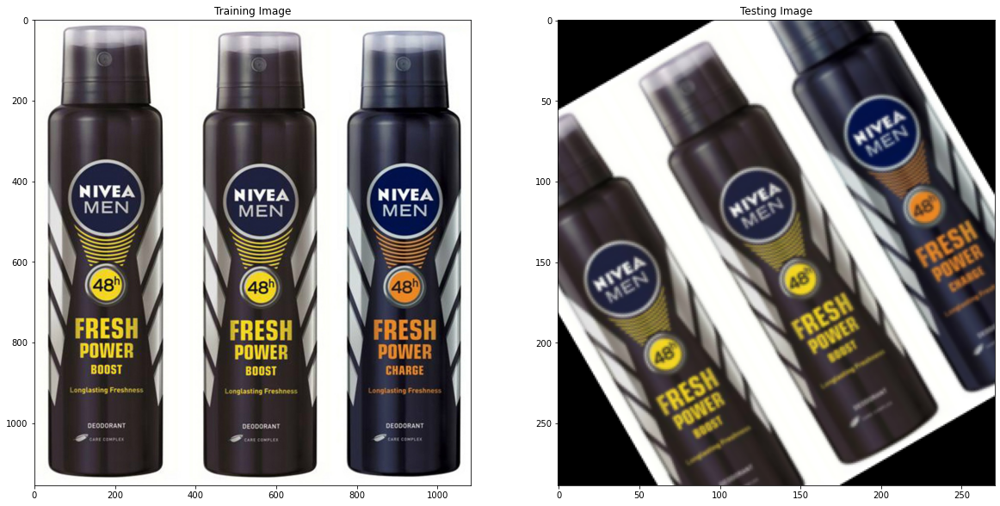

In [57]:
# Load the image
image1 = cv2.imread(url)

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_RGB2GRAY)

# Create test image by adding Scale Invariance and Rotational Invariance
test_image = cv2.pyrDown(training_image)
test_image = cv2.pyrDown(test_image)
num_rows, num_cols = test_image.shape[:2]

rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

# Display traning image and testing image
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Training Image")
plots[0].imshow(training_image)

plots[1].set_title("Testing Image")
plots[1].imshow(test_image)

#### SIFT

Number of Keypoints Detected In The Training Image: 2920
Number of Keypoints Detected In The Query Image: 552


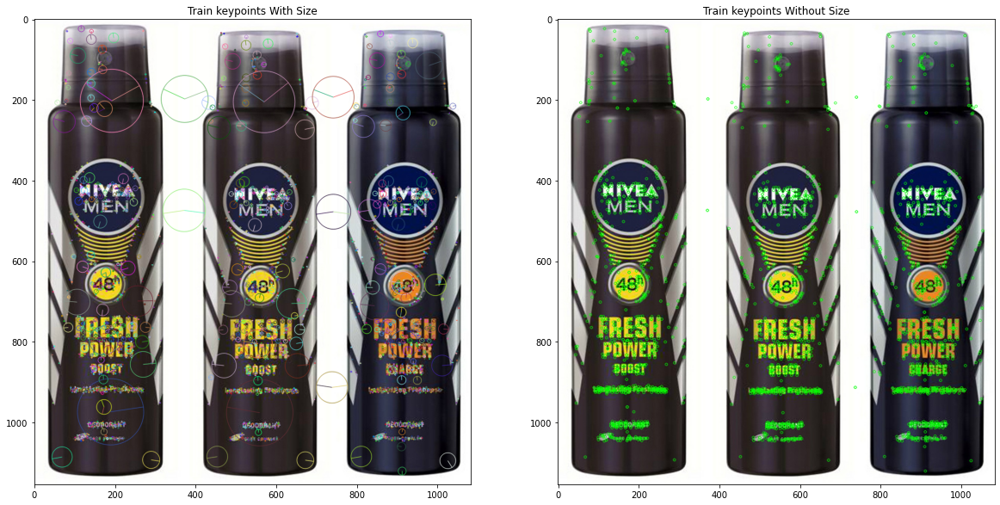

In [58]:
sift = cv2.xfeatures2d.SIFT_create()

train_keypoints, train_descriptor = sift.detectAndCompute(training_gray, None)
test_keypoints, test_descriptor = sift.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(training_image)
keypoints_with_size = np.copy(training_image)

cv2.drawKeypoints(training_image, train_keypoints, keypoints_without_size, color=(0, 255, 0))

cv2.drawKeypoints(training_image, train_keypoints, keypoints_with_size, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image:", len(train_keypoints))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image:", len(test_keypoints))

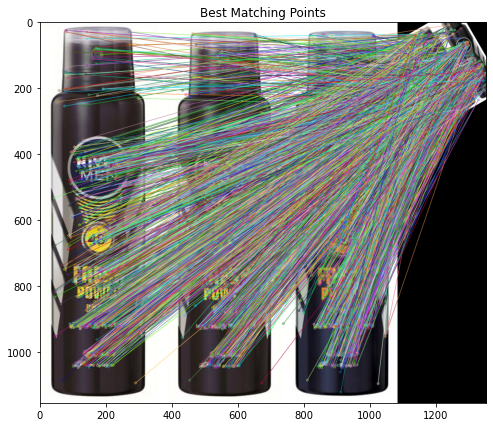


Number of Matching Keypoints Between The Training and Query Images: 2920


In [59]:
# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=False)

# Perform the matching between the SIFT descriptors of the training image and the test image
matches = bf.match(train_descriptor, test_descriptor)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(training_image, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags=2)

# Display the best matching points
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images:", len(matches))

#### ORB

Number of Keypoints Detected In The Training Image: 500
Number of Keypoints Detected In The Query Image: 480


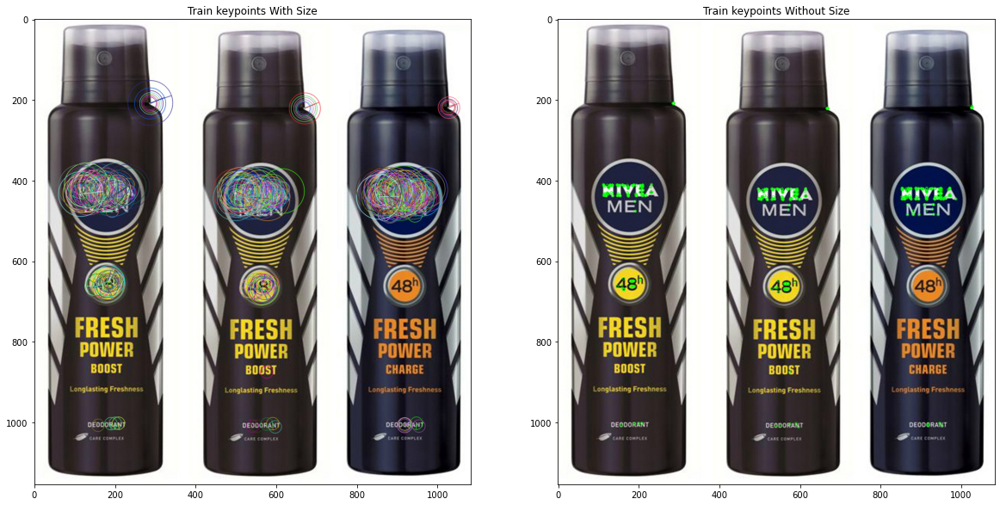

In [60]:
orb = cv2.ORB_create()

train_keypoints, train_descriptor = orb.detectAndCompute(training_gray, None)
test_keypoints, test_descriptor = orb.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(training_image)
keypoints_with_size = np.copy(training_image)

cv2.drawKeypoints(training_image, train_keypoints, keypoints_without_size, color=(0, 255, 0))

cv2.drawKeypoints(training_image, train_keypoints, keypoints_with_size, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image:", len(train_keypoints))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image:", len(test_keypoints))

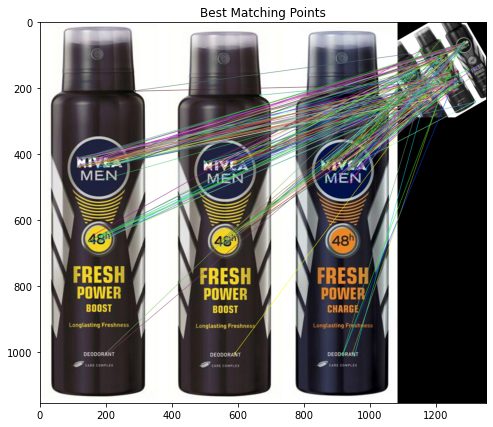


Number of Matching Keypoints Between The Training and Query Images: 215


In [61]:
# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Perform the matching between the ORB descriptors of the training image and the test image
matches = bf.match(train_descriptor, test_descriptor)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(training_image, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags=2)

# Display the best matching points
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images:", len(matches))

#### SURF

Number of Keypoints Detected In The Training Image: 6327
Number of Keypoints Detected In The Query Image: 772


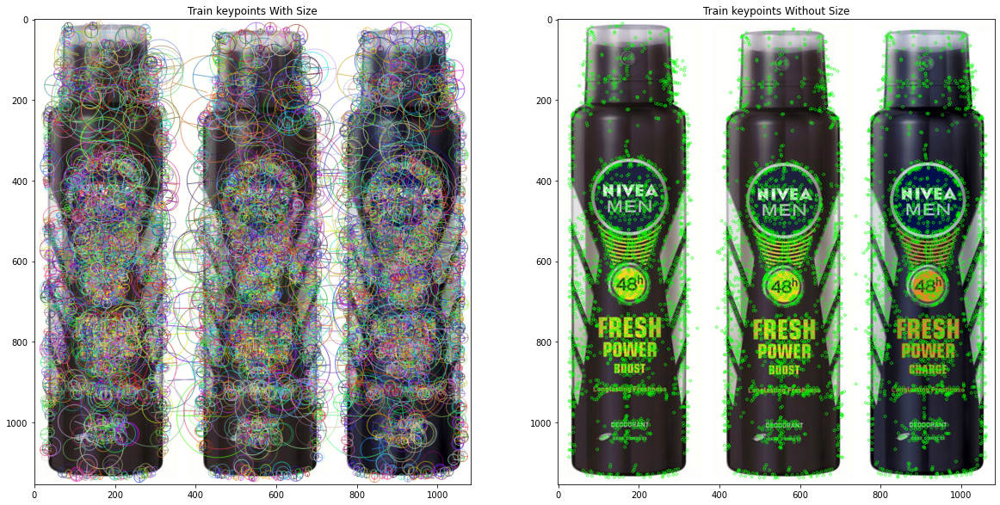

In [62]:
surf = cv2.xfeatures2d.SURF_create()

train_keypoints, train_descriptor = surf.detectAndCompute(training_gray, None)
test_keypoints, test_descriptor = surf.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(training_image)
keypoints_with_size = np.copy(training_image)

cv2.drawKeypoints(training_image, train_keypoints, keypoints_without_size, color=(0, 255, 0))

cv2.drawKeypoints(training_image, train_keypoints, keypoints_with_size, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image:", len(train_keypoints))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image:", len(test_keypoints))

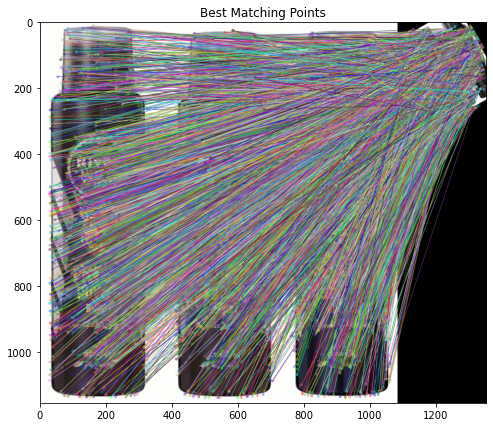


Number of Matching Keypoints Between The Training and Query Images: 6327


In [63]:
# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=False)

# Perform the matching between the SURF descriptors of the training image and the test image
matches = bf.match(train_descriptor, test_descriptor)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(training_image, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags=2)

# Display the best matching points
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images:", len(matches))

#### FAST

Number of Keypoints Detected In The Image With Non Max Suppression: 6936
Number of Keypoints Detected In The Image Without Non Max Suppression: 37367


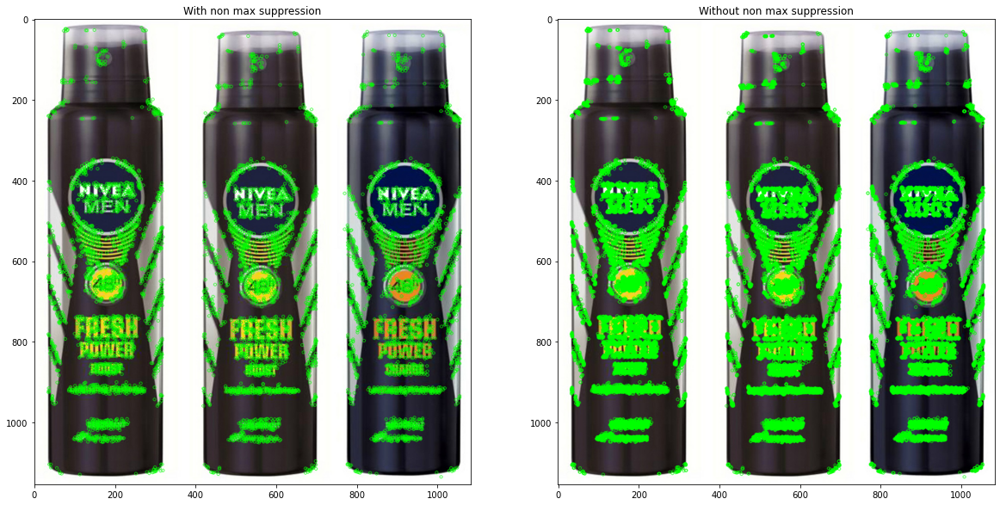

In [64]:
image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

fast = cv2.FastFeatureDetector_create() 

# Detect keypoints with non max suppression
keypoints_with_nonmax = fast.detect(gray, None)

# Disable nonmaxSuppression 
fast.setNonmaxSuppression(False)

# Detect keypoints without non max suppression
keypoints_without_nonmax = fast.detect(gray, None)

image_with_nonmax = np.copy(image)
image_without_nonmax = np.copy(image)

# Draw keypoints on top of the input image
cv2.drawKeypoints(image, keypoints_with_nonmax, image_with_nonmax, color=(0,255,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(image, keypoints_without_nonmax, image_without_nonmax, color=(0,255,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without non max suppression
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("With non max suppression")
plots[0].imshow(image_with_nonmax)

plots[1].set_title("Without non max suppression")
plots[1].imshow(image_without_nonmax)

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Image With Non Max Suppression:", len(keypoints_with_nonmax))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Image Without Non Max Suppression:", len(keypoints_without_nonmax))

#### BRIEF

Number of Keypoints Detected In The Training Image: 6922
Number of Keypoints Detected In The Query Image: 1137


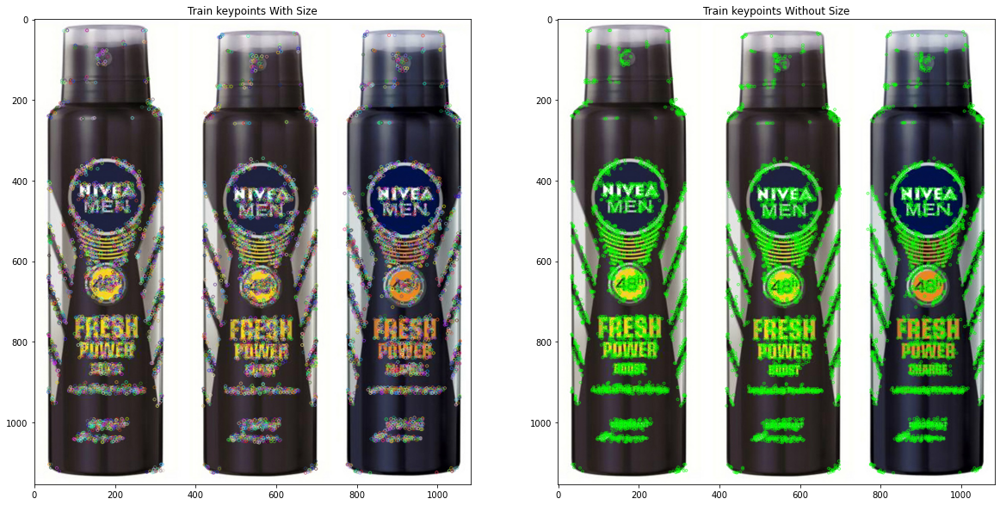

In [65]:
fast = cv2.FastFeatureDetector_create() 
brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()

train_keypoints = fast.detect(training_gray, None)
test_keypoints = fast.detect(test_gray, None)

train_keypoints, train_descriptor = brief.compute(training_gray, train_keypoints)
test_keypoints, test_descriptor = brief.compute(test_gray, test_keypoints)

keypoints_without_size = np.copy(training_image)
keypoints_with_size = np.copy(training_image)

cv2.drawKeypoints(training_image, train_keypoints, keypoints_without_size, color=(0, 255, 0))

cv2.drawKeypoints(training_image, train_keypoints, keypoints_with_size, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image:", len(train_keypoints))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image:", len(test_keypoints))

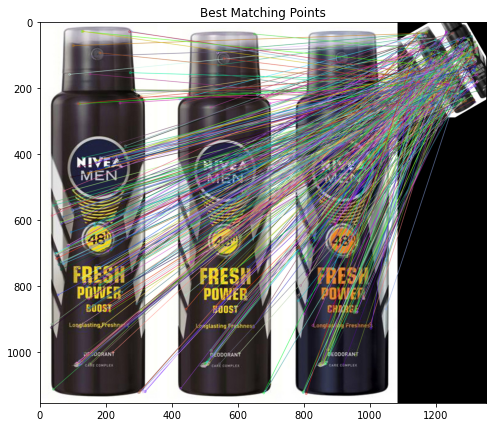


Number of Matching Keypoints Between The Training and Query Images: 493


In [66]:
# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Perform the matching between the BRIEF descriptors of the training image and the test image
matches = bf.match(train_descriptor, test_descriptor)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(training_image, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)

# Display the best matching points
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images:", len(matches))

### Preprocessing

In [67]:
#Get matrix of all the images in the sample
test['image'] = test['image'].apply(lambda x: 'Flipkart/Images/'+str(x))
test['matrix'] = test['image'].apply(lambda x: np.array(Image_PIL.open(x)))

train['image'] = train['image'].apply(lambda x: 'Flipkart/Images/'+str(x))
train['matrix'] = train['image'].apply(lambda x: np.array(Image_PIL.open(x)))

In [68]:
def preprocess(img):
    #Gets the image path as input and returns the matrix of the converted image
    img = cv2.imread(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) #conversion to gray scale
    
    size = 224 #same as VGG16
    h, w = img.shape[:2]
    
    #Reshape keeping the proportions
    if h > w:
        aspect = h // size
        dim = (int(w//aspect), size)
    elif h < w:
        aspect = w // size
        dim = (size, int(h//aspect))
    else:
        dim = (size, size)
    
    img = cv2.resize(img, dim, interpolation=cv2.INTER_AREA)
    img = cv2.equalizeHist(img)
    
    return img

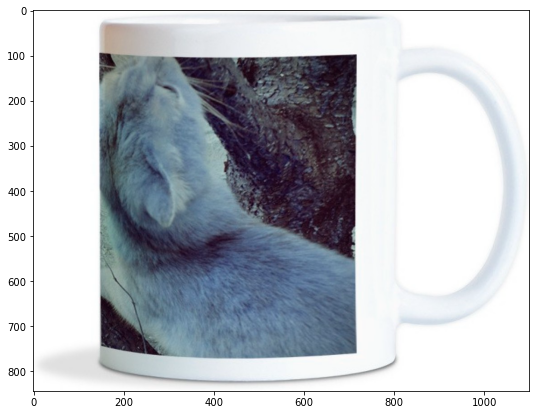

In [69]:
plt.imshow(cv2.imread(train.iloc[0]['image']))

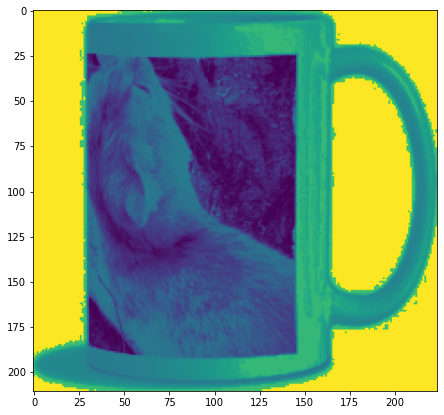

In [70]:
plt.imshow(preprocess(train.iloc[0]['image']))

In [71]:
from sklearn.preprocessing import normalize

def pipeline_df(df, clahe, what='SIFT'):
    #Initialize the chosen algorithm
    if what == 'SIFT':
        temp = cv2.xfeatures2d.SIFT_create()
    elif what == 'ORB':
        temp = cv2.ORB_create()
    elif what == 'SURF':
        temp = cv2.xfeatures2d.SURF_create()
    elif what == 'FAST':
        temp = cv2.FastFeatureDetector_create() 
    elif what == 'BRIEF':
        fast = cv2.FastFeatureDetector_create() 
        brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()
    else:
        print('Algorithm name error')
        return df
    
    df['keypoints'] = ''
    df['descriptor'] = ''
    df['resize'] = ''
    
    descriptors = []
    
    i = 0
    
    for key, path in df['image'].items():
        img = preprocess(path)
        cl = clahe.apply(img)
        df.at[key, 'resize'] = cl
        
        #Calculate keypoints and their orientation for each image
        if what == 'BRIEF':
            kp = fast.detect(cl, None)
            kp, dsc = brief.compute(cl, kp)
        elif what == 'FAST':
            temp.setNonmaxSuppression(False)
            kp = temp.detect(cl, None)
            dsc = 0
        else: #For all the other algorithms
            kp, dsc = temp.detectAndCompute(cl, None)
        
        #Keypoints and Descriptors dataframe
        if dsc is not None:
            df.at[key, 'keypoints'] = kp
            df.at[key, 'descriptor'] = dsc
            #descriptors.append(dsc)
            descriptors.append((path, dsc))
        else:
            print('The descritor of the image n° {} is None'.format(i))
            df.at[key, 'descriptor'] = 0
        
        i += 1
    
    #Descriptors Stacking in an array
    desc = descriptors[0][1]
    for path, descriptor in descriptors[1:]:
        desc = np.vstack((desc, descriptor))
    
    return df, desc.astype(float), descriptors

### SIFT method

Le Scale-Invariant Feature Transform (SIFT) est un algorithme de détection de features pour détecter et décrire les caractéristiques locales dans des images.

Les points clés (keypoints) SIFT des objets sont d'abord extraits d'un ensemble d'images de référence et stockés dans une base de données. Un objet est reconnu dans une nouvelle image en comparant individuellement chaque caractéristique de la nouvelle image à cette base de données et en trouvant des caractéristiques d'appariement candidates sur la base de la distance euclidienne de leurs vecteurs de caractéristiques.

À partir de l'ensemble complet des correspondances, des sous-ensembles de points clés qui correspondent à l'objet et à son emplacement, son échelle et son orientation dans la nouvelle image sont identifiés pour filtrer les bonnes correspondances. La détermination de clusters cohérents est effectuée : chaque groupe de trois caractéristiques ou plus qui s'accordent sur un objet et son orientation est ensuite soumis à une vérification et les valeurs aberrantes sont ensuite rejetées.

Enfin, la probabilité qu'un ensemble particulier de caractéristiques indique la présence d'un objet est calculée, compte tenu de la précision de l'ajustement et du nombre de fausses correspondances probables. Les correspondances d'objets qui réussissent tous ces tests peuvent être identifiées comme correctes.

Donc, la méthodologie SIFT se fait en quatre étapes :
- Extraction des keypoints et descripteurs
- Création de une Bag of Visual Words avec les descripteurs de chaque image
- Clusterisation de l'ensemble des descripteurs
- Mise en correspondance entre les descripteurs de chaque image et les clusters

In [72]:
clahe = cv2.createCLAHE(clipLimit=0.5, tileGridSize=(8,8))
test, desc_test, desc_test_list = pipeline_df(test, clahe, 'SIFT')
train, desc_train, desc_train_list = pipeline_df(train, clahe, 'SIFT')

test.to_csv('data_save/test_pipeline.csv')
train.to_csv('data_save/train_pipeline.csv')

In [73]:
from scipy.cluster.vq import kmeans, vq

bovw = {} #bag of visual words, image features
k = [25, 50, 100, 200, 300] #centroids to test

#Clusterization with Scipy to force the number of centroids to generate
for n in k:
    voc, variance = kmeans(desc_train, n, 1)
    bovw[n] = np.zeros((len(train['image']), n), 'float32')
    for i in range(len(train['image'])):
        words, distance = vq(desc_train_list[i][1], voc)
        for w in words:
            bovw[n][i][w] += 1

n = 25
(787, 9)



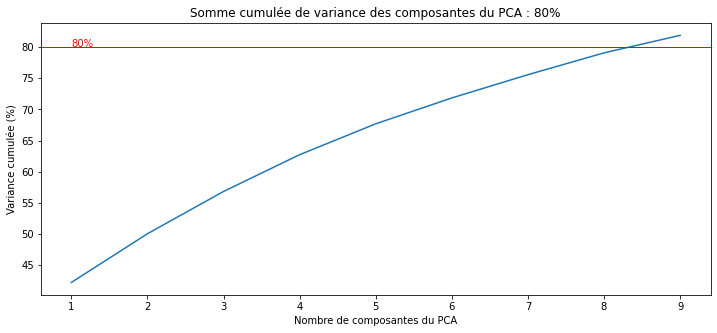

T-SNE
T-SNE fitting...done

n = 50
(787, 17)



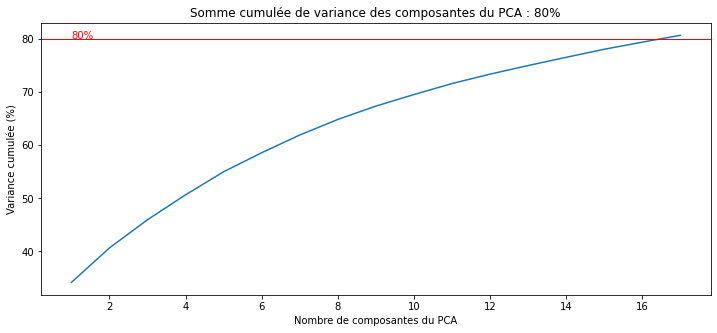

T-SNE
T-SNE fitting...done

n = 100
(787, 36)



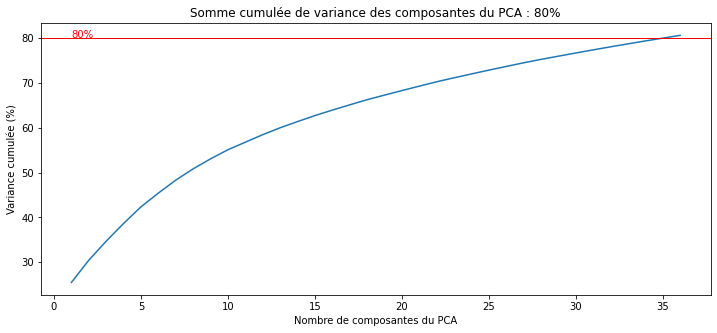

T-SNE
T-SNE fitting...done

n = 200
(787, 70)



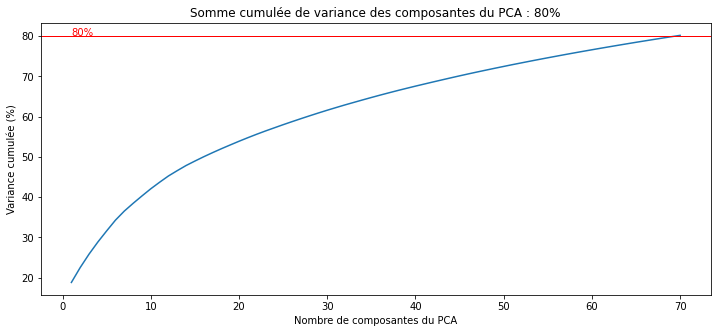

T-SNE
T-SNE fitting...done

n = 300
(787, 101)



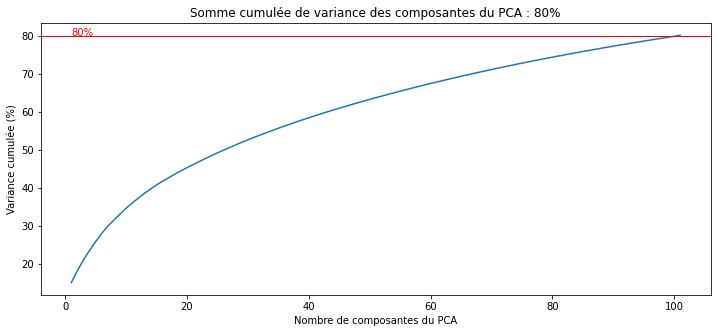

T-SNE
T-SNE fitting...done



In [74]:
from sklearn.preprocessing import StandardScaler

ss_bovw = {}
tsne_bovw = {}

for key, value in bovw.items():
    print('n = {}'.format(key))
    
    stdslr = StandardScaler().fit(value)
    im_features = stdslr.transform(value)
    ss_bovw[key] = im_features

    pca, x = pca_function(im_features)
    pca_graph(pca)
    
    print('T-SNE', end='\n')
    print('T-SNE fitting...', end='')

    tsne_result = tsne_function(x)
    tsne_bovw[key] = tsne_result
    
    print('done', end='\n\n')

In [75]:
scores = {}
labels = {}
km_models = {}

for key, value in tsne_bovw.items():
    nc = train['cat_1'].nunique()
    result, y_train, kmeans_model = kmeans_function(value, train, nc)
    labels[key] = y_train
    scores[key] = result
    km_models[key] = kmeans_model
    print('For n = {} centroids, with {} clusters'.format(key, nc))
    print('Adjusted Rand Score = {}'.format(result), end='\n\n')

key_max = max(scores, key=scores.get)
ari_df['SIFT'] = scores[key_max]
print('Key Max: {}'.format(key_max))
print('Max Score: {}'.format(scores[key_max]))

For n = 25 centroids, with 7 clusters
Adjusted Rand Score = 0.03223741578291756

For n = 50 centroids, with 7 clusters
Adjusted Rand Score = 0.04189591276048931

For n = 100 centroids, with 7 clusters
Adjusted Rand Score = 0.03893879136898949

For n = 200 centroids, with 7 clusters
Adjusted Rand Score = 0.042680749581653576

For n = 300 centroids, with 7 clusters
Adjusted Rand Score = 0.049049222073369286

Key Max: 300
Max Score: 0.049049222073369286


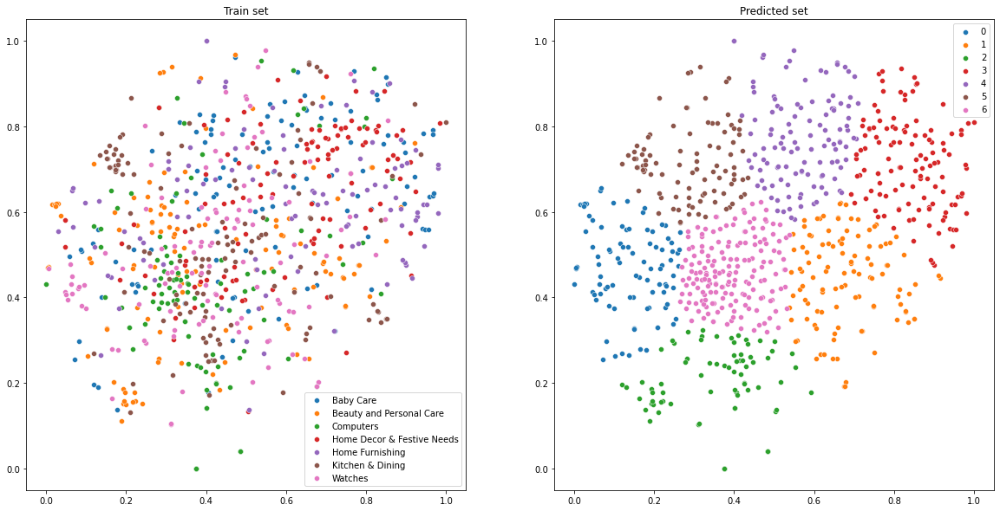

In [76]:
#Visualization of Bag of Visual Words
nc = train['cat_1'].nunique()

X_normalized = MinMaxScaler().fit_transform(tsne_bovw[key_max])
y_train = train['cat_1'].values
train_cat_looper = np.unique(y_train)
pred_cat_looper = np.unique(y_pred)

fig = plt.figure(1, figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.title('Train set')
for c in train_cat_looper:
    sns.scatterplot(X_normalized[y_train == c, 0],
                    X_normalized[y_train == c, 1],
                    label=c, 
                    palette=sns.color_palette("hls", nc),
                   )

plt.subplot(1, 2, 2)
plt.title('Predicted set')
for c in pred_cat_looper:
    sns.scatterplot(X_normalized[labels[key_max] == c, 0],
                    X_normalized[labels[key_max] == c, 1],
                    label=c, 
                    palette=sns.color_palette("hls", nc),
                   )
plt.show()

In [77]:
#Images over T-SNE visualization
#Idea taken from:
#https://jakevdp.github.io/PythonDataScienceHandbook/05.10-manifold-learning.html
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

def plot_components(source, images=None, thumb_frac=0.5, cmap='gray'):
    proj_min = np.min(source, 0)
    proj_max = np.max(source, 0)
    
    proj = (source - proj_min) / (proj_max - proj_min)
    
    fig, ax = plt.subplots(figsize=(20, 20))
    ax.scatter(proj[:, 0], proj[:, 1], marker='.')
    
    if images is not None:
        min_dist_2 = (thumb_frac * max(proj_max - proj_min)) ** 2
        shown_images = np.array([2 * proj_max])
        
        i = 0
        for key, value in images.items():
            dist = np.sum((proj[i] - shown_images) ** 2, 1)
            
            if np.min(dist) < min_dist_2 : #don't show points
                continue
            
            show_images = np.vstack([shown_images, proj[i]])
            imagebox = AnnotationBbox(OffsetImage(images[key], cmap=cmap, zoom=0.2), proj[i])
            ax.add_artist(imagebox)
            i += 1

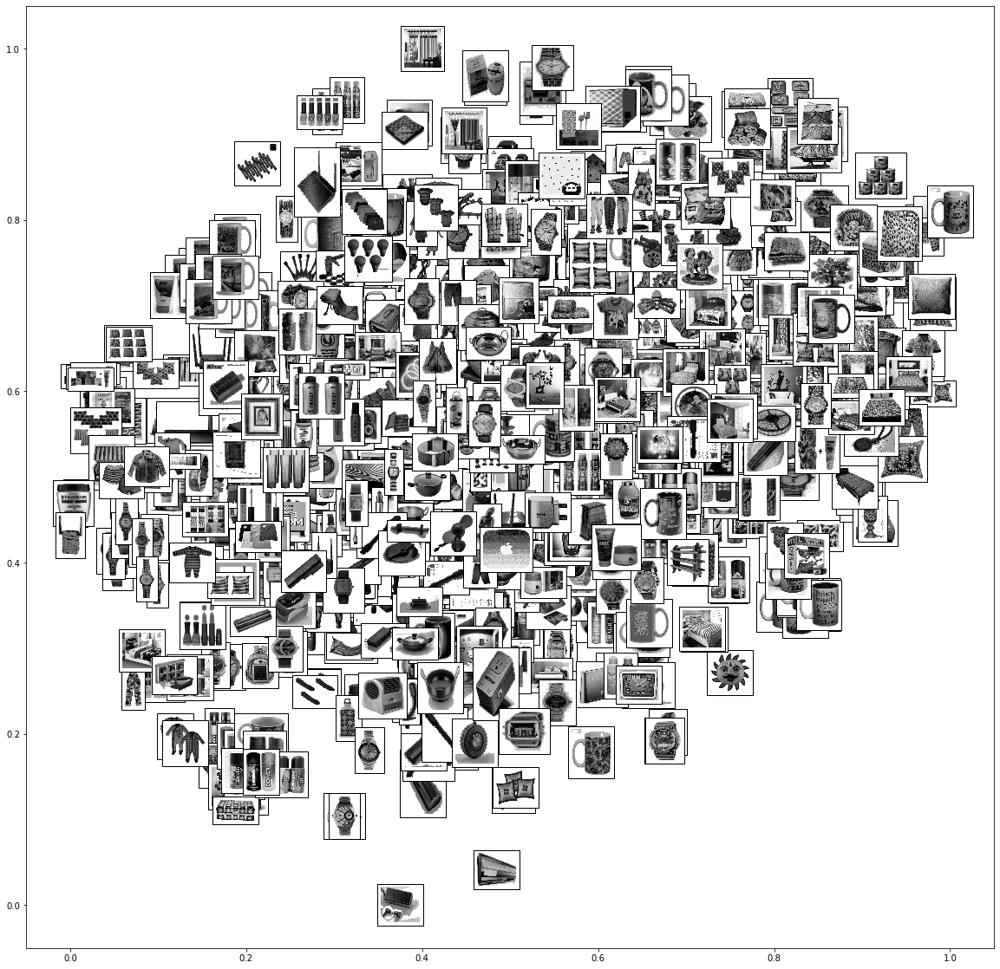

In [78]:
plot_components(tsne_bovw[key_max], train['resize'])

In [79]:
bovw_test = {} #bag of visual words, image features

#Clusterization with Scipy to force the number of centroids to generate

voc, variance = kmeans(desc_test, key_max, 1)
bovw_test = np.zeros((len(test['image']), key_max), 'float32')
for i in range(len(test['image'])):
    words, distance = vq(desc_test_list[i][1], voc)
    for w in words:
        bovw_test[i][w] += 1

In [80]:
stdslr = StandardScaler().fit(bovw_test)
im_features = stdslr.transform(bovw_test)

pca, x = pca_function(im_features)
tsne_result_test = tsne_function(x)

(263, 59)



In [81]:
predictions = km_models[key_max].predict(tsne_result_test) #y_test = predict(x_test)
true_value = category_encoder.fit_transform(test['cat_1'])
acc_sift = accuracy_score(predictions, true_value)
acc_df['SIFT'] = acc_sift
print('Accuracy: {}'.format(acc_sift))

Accuracy: 0.1634980988593156


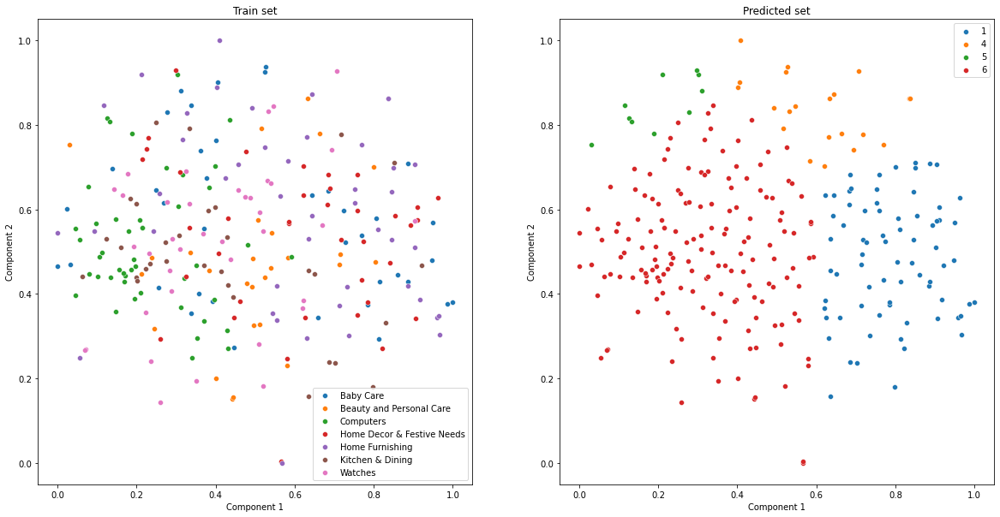

In [82]:
tsne_visualization(tsne_result_test, predictions, test['cat_1'].values, data)

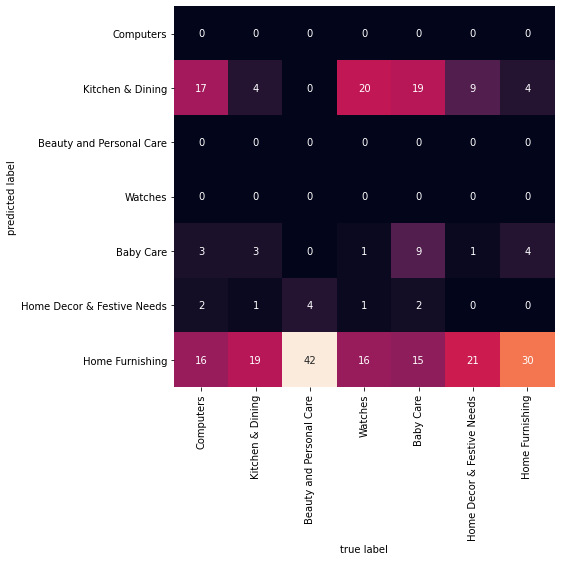

In [83]:
graph_conf_matrix(predictions, test)

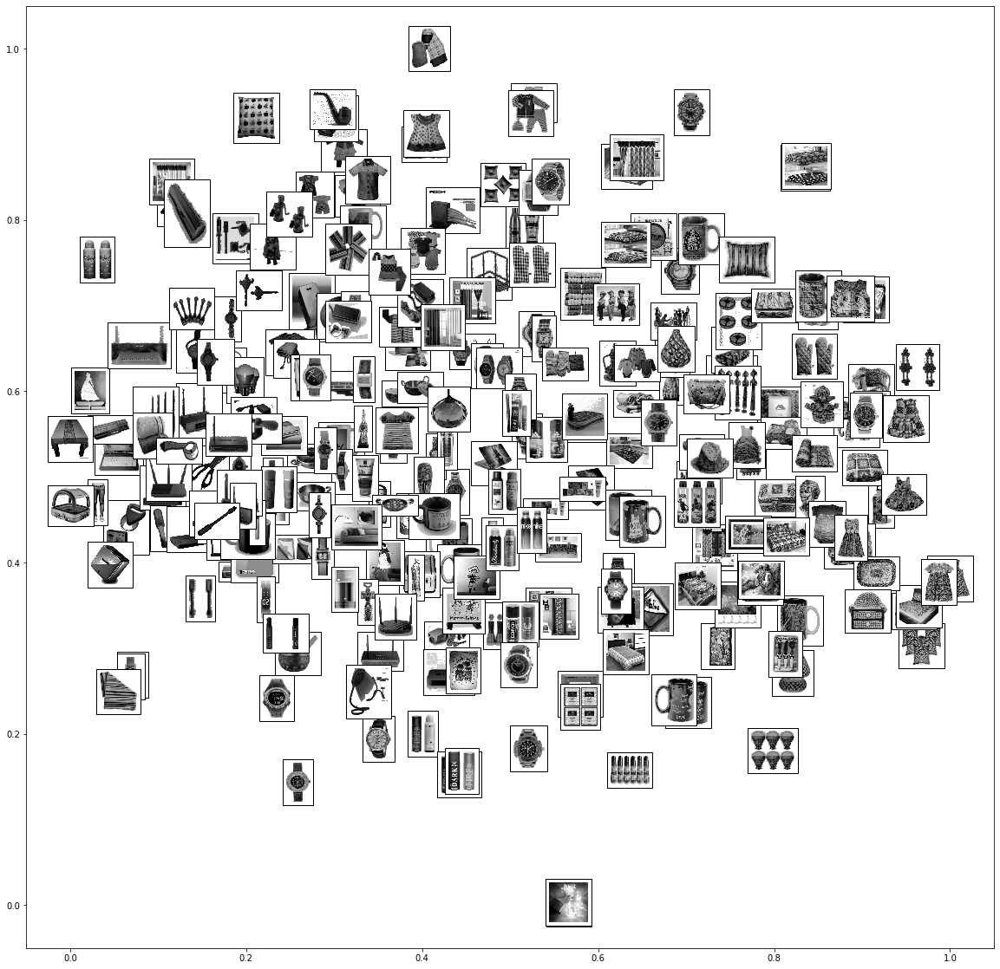

In [84]:
plot_components(tsne_result_test, test['resize'])

16% d'accuracy pour le modèle avec SIFT. Le résultat n'est pas concluant.

## Transfer Learning

Source : https://machinelearningmastery.com/how-to-use-transfer-learning-when-developing-convolutional-neural-network-models/

### Pre-Trained Model as Feature Extractor Preprocessor
>The pre-trained model may be used as a standalone program to extract features from new photographs.

>Specifically, the extracted features of a photograph may be a vector of numbers that the model will use to describe the specific features in a photograph. These features can then be used as input in the development of a new model.

>The last few layers of the VGG16 model are fully connected layers prior to the output layer. These layers will provide a complex set of features to describe a given input image and may provide useful input when training a new model for image classification or related computer vision task.

>The image can be loaded and prepared for the model.

>We will load the model with the classifier output part of the model, but manually remove the final output layer. This means that the second last fully connected layer with 4096 nodes will be the new output layer.

>This vector of 4096 numbers will be used to represent the complex features of a given input image that can then be saved to file to be loaded later and used as input to train a new model.

In [85]:
from keras.applications.vgg16 import VGG16
from keras.models import Model

model = VGG16() #Creation of VGG16 model implemented by Keras
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)

In [86]:
from keras.preprocessing.image import load_img, img_to_array
from keras.applications.vgg16 import preprocess_input

def preprocess_VGG16(img):
    img = load_img(img, target_size=(224,224)) #VGG16 expects a 224x224 image np.array
    img = np.array(img) 
    img = img.reshape(1,224,224,3) 
    img = preprocess_input(img) #for VGG16
    return img

def model_vgg16(img, model=model):
    features = model.predict(img, use_multiprocessing=True)
    return features

In [87]:
#train['image']
data['path'] = data['image'].apply(lambda x: 'Flipkart/Images/'+str(x))

In [88]:
# data['resize_VGG16'] = data['path'].apply(preprocess_VGG16)
# data['preprocess_VGG16'] = data['resize_VGG16'].apply(model_vgg16)

train['resize_VGG16'] = train['image'].apply(preprocess_VGG16)
train['preprocess_VGG16'] = train['resize_VGG16'].apply(model_vgg16)

test['resize_VGG16'] = test['image'].apply(preprocess_VGG16)
test['preprocess_VGG16'] = test['resize_VGG16'].apply(model_vgg16)

In [89]:
# vgg16_feat = np.array(data['preprocess_VGG16'].values.tolist())
# print('Shape:', vgg16_feat.shape)
# vgg16_feat = vgg16_feat.reshape(-1, vgg16_feat.shape[2])
# print('Reshape Shape:', vgg16_feat.shape)

vgg16_feat = np.array(train['preprocess_VGG16'].values.tolist())
vgg16_feat_test = np.array(test['preprocess_VGG16'].values.tolist())
print('Shape:', vgg16_feat.shape)
vgg16_feat = vgg16_feat.reshape(-1, vgg16_feat.shape[2])
vgg16_feat_test = vgg16_feat_test.reshape(-1, vgg16_feat_test.shape[2])
print('Reshape Shape:', vgg16_feat.shape)

Shape: (787, 1, 4096)
Reshape Shape: (787, 4096)


(787, 133)

(263, 76)



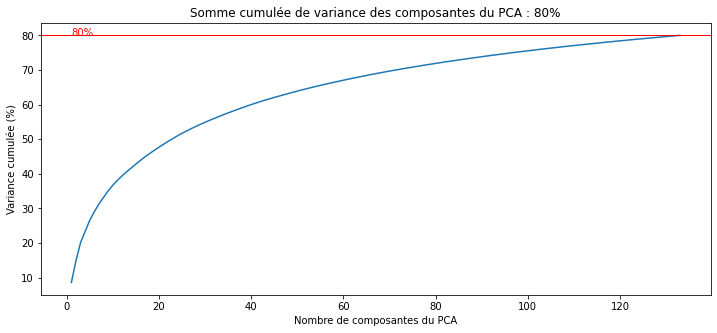

In [90]:
pca, x = pca_function(vgg16_feat)
pca_test, x_test = pca_function(vgg16_feat_test)
pca_graph(pca)

tsne_result = tsne_function(x)
tsne_result_test = tsne_function(x_test)
# result, y_train, kmeans_model = kmeans_function(tsne_result, data)
result, y_train, kmeans_model = kmeans_function(tsne_result, train)

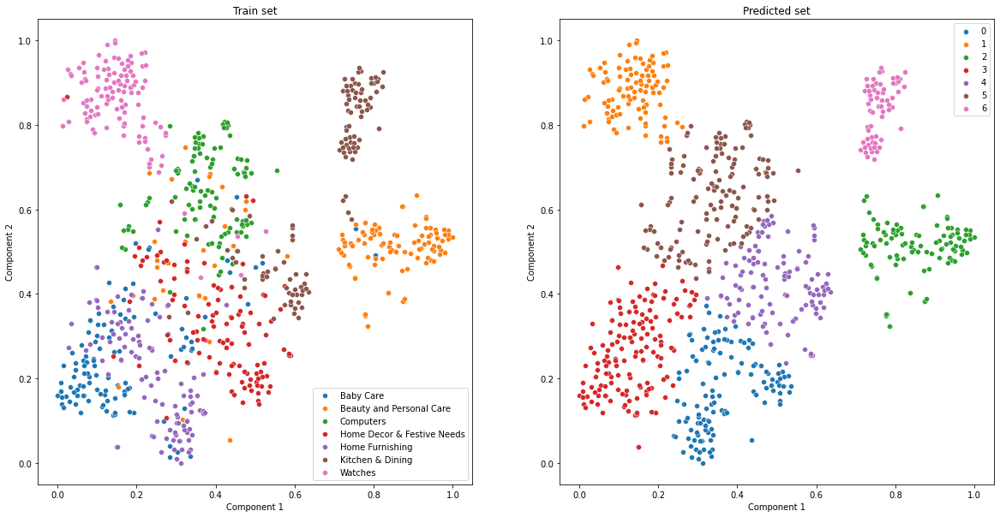

In [91]:
# tsne_visualization(tsne_result, y_train, data['cat_1'].values, data)
tsne_visualization(tsne_result, y_train, train['cat_1'].values, data)

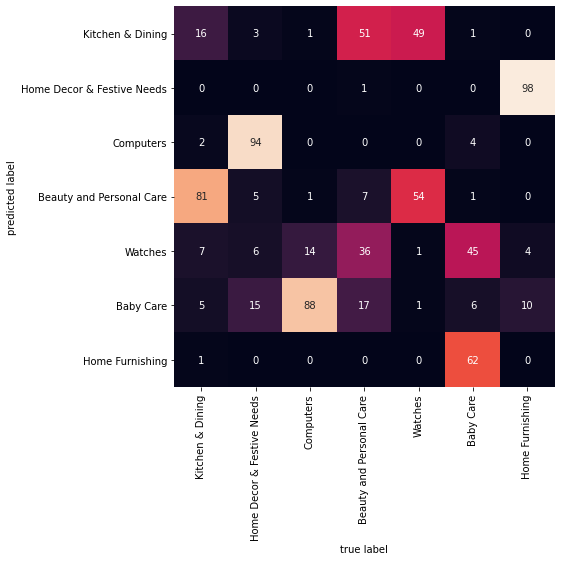

In [92]:
# graph_conf_matrix(y_train, data)
graph_conf_matrix(y_train, train)

In [93]:
ari_df['VGG16'] = result
print('Adjusted Rand Score = {}'.format(result))

Adjusted Rand Score = 0.4559491194537889


In [94]:
# data['resize'] = ''

# for key, path in data['path'].items():
#     img = preprocess(path)
#     cl = clahe.apply(img)
#     data.at[key, 'resize'] = cl

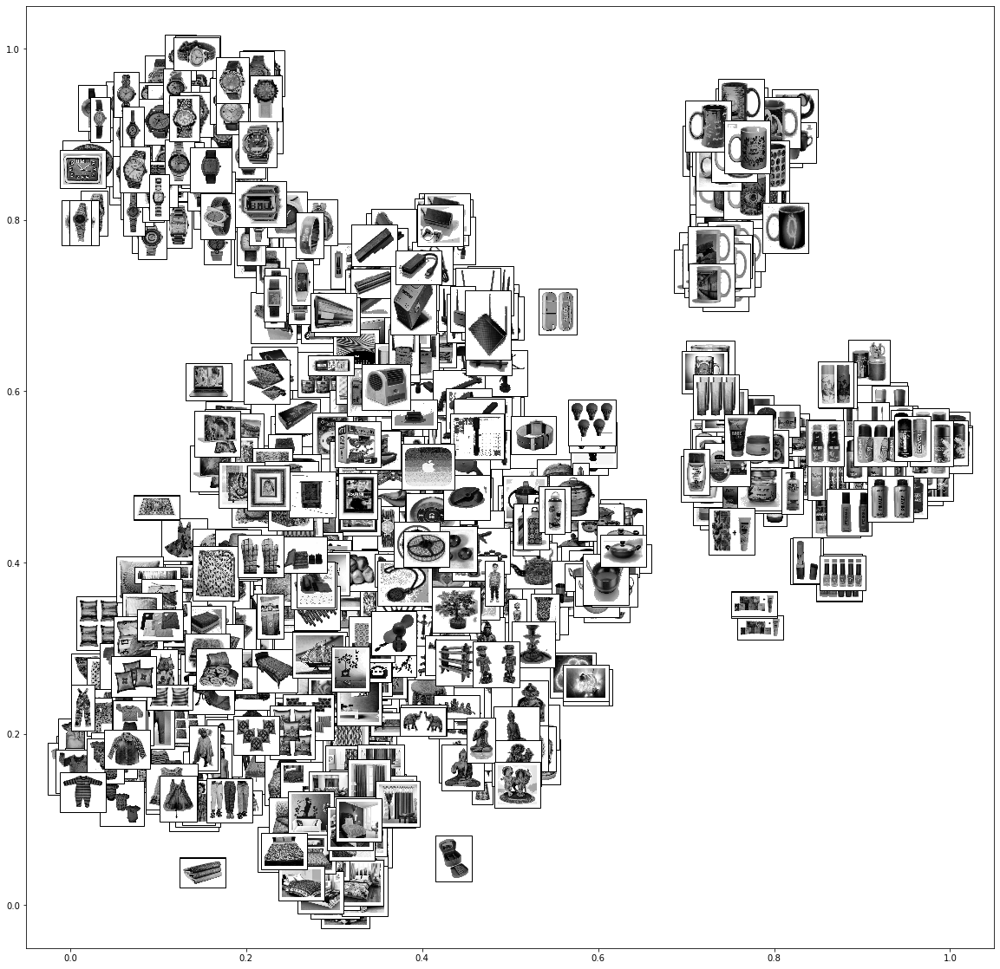

In [95]:
# plot_components(tsne_result, data['resize'])
plot_components(tsne_result, train['resize'])

In [96]:
predictions = kmeans_model.predict(tsne_result_test) #y_test = predict(x_test)
true_value = category_encoder.fit_transform(test['cat_1'])
acc_vgg16 = accuracy_score(predictions, true_value)
acc_df['VGG_16'] = acc_vgg16
print('Accuracy: {}'.format(acc_vgg16))

Accuracy: 0.11406844106463879


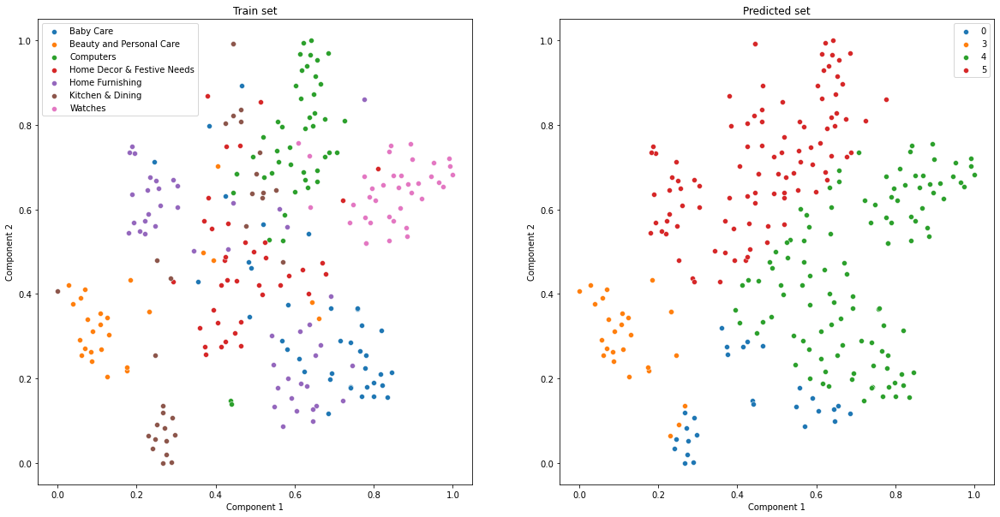

In [97]:
tsne_visualization(tsne_result_test, predictions, test['cat_1'].values, data)

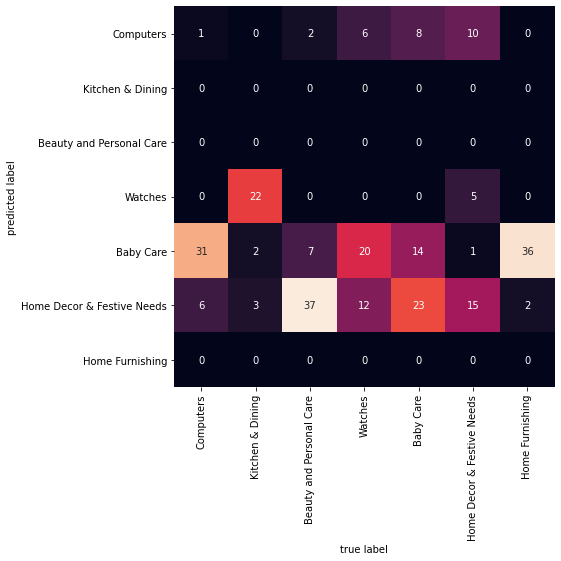

In [98]:
graph_conf_matrix(predictions, test)

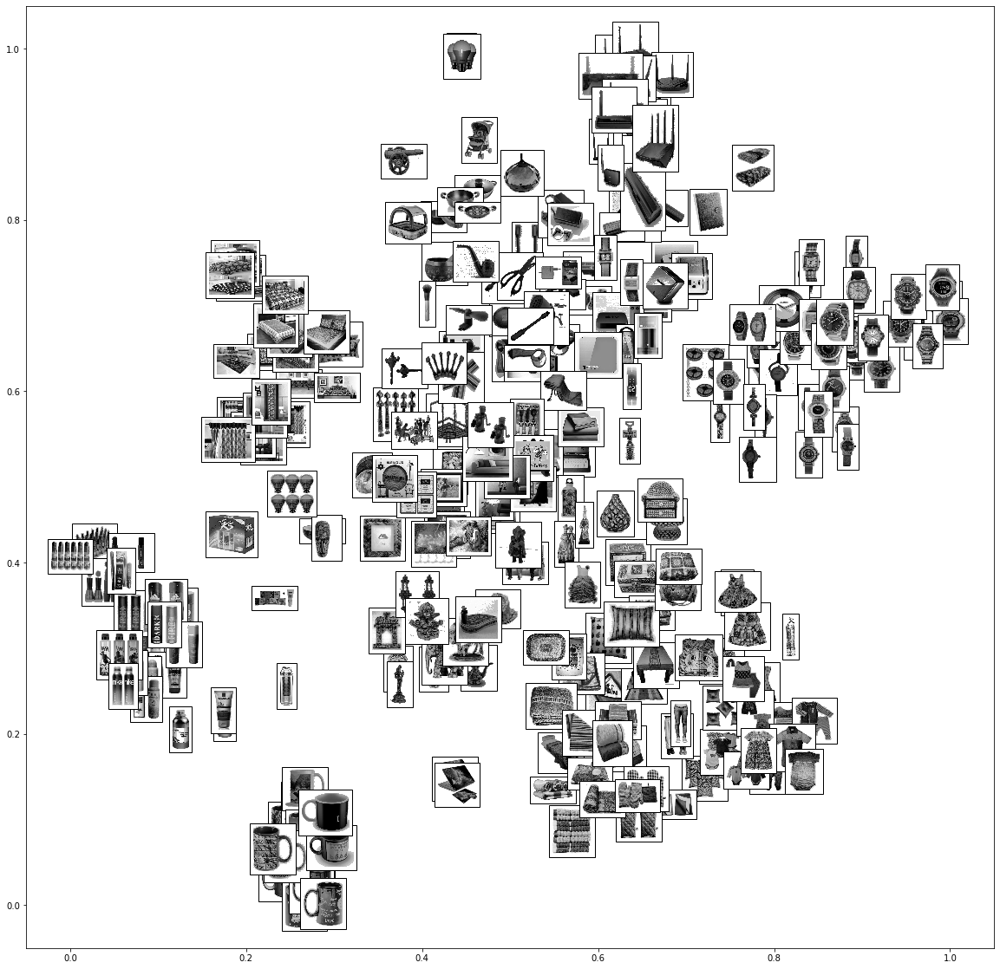

In [99]:
plot_components(tsne_result_test, test['resize'])

## ARI

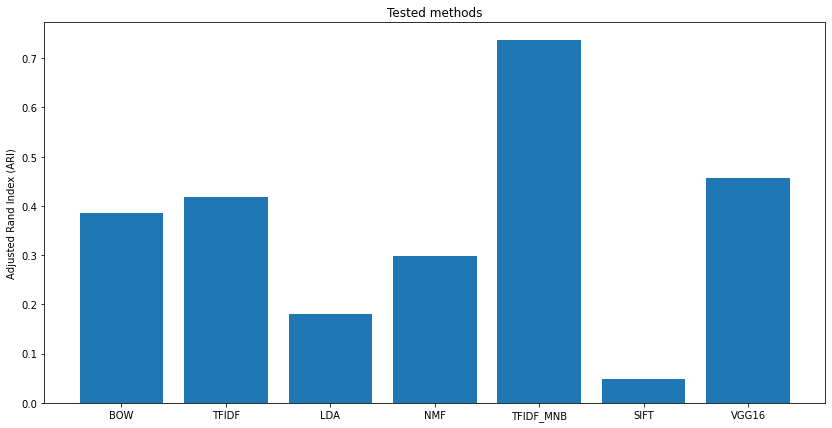

In [100]:
g = plt.bar(range(len(ari_df)), list(ari_df.values()))
plt.xticks(range(len(ari_df)), list(ari_df.keys()))
plt.ylabel('Adjusted Rand Index (ARI)')
plt.title('Tested methods')
plt.show()

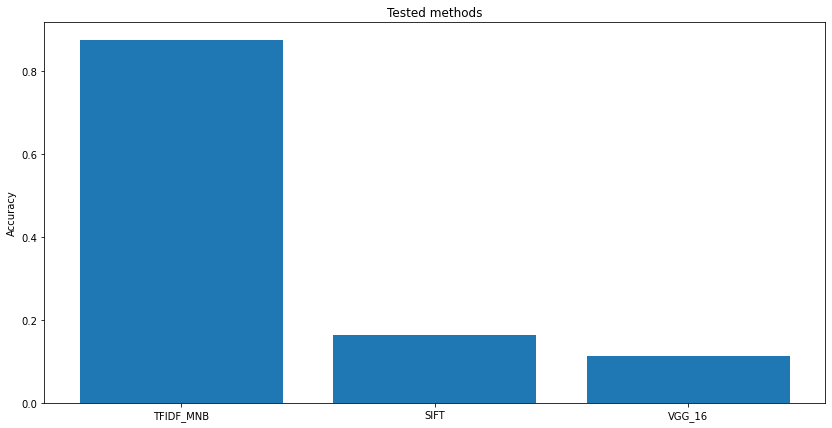

In [102]:
g = plt.bar(range(len(acc_df)), list(acc_df.values()))
plt.xticks(range(len(acc_df)), list(acc_df.keys()))
plt.ylabel('Accuracy')
plt.title('Tested methods')
plt.show()

## TF-IDF + MNB

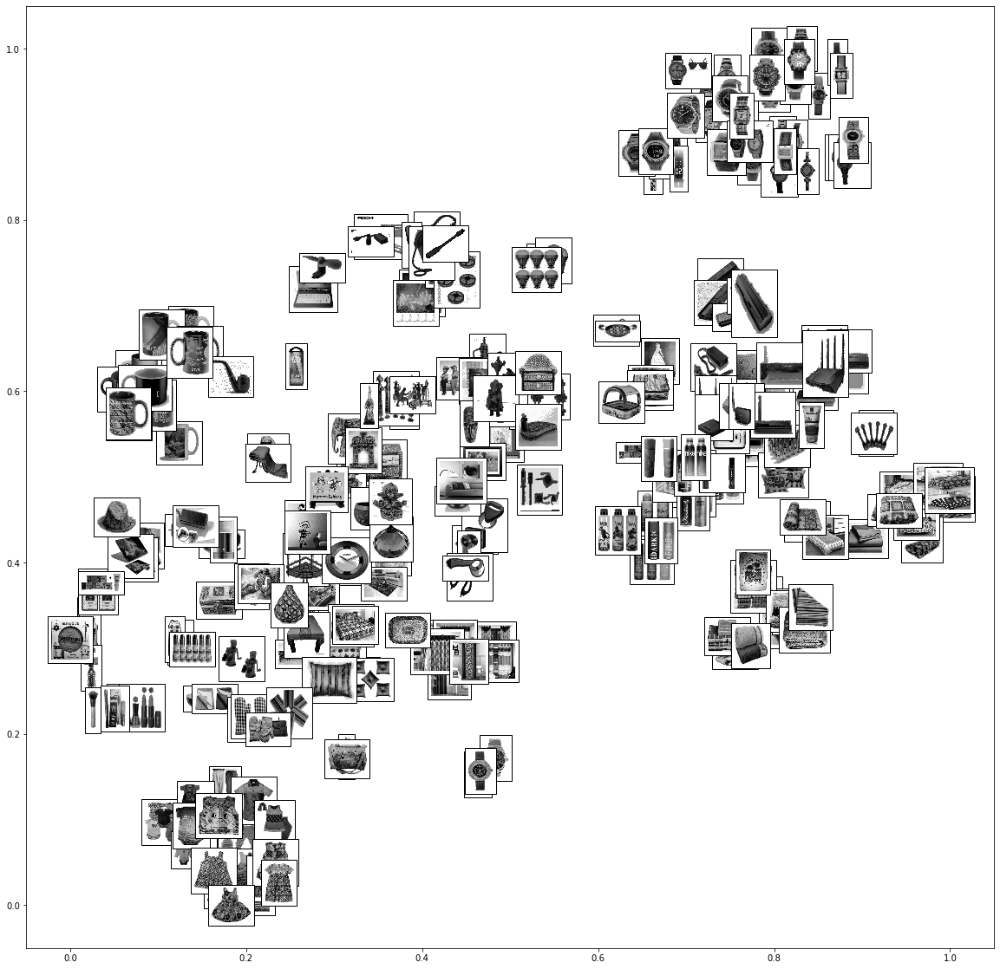

In [101]:
plot_components(tfidf_mnb_tsne_result, test['resize'])

# Résultats

**Résultats du clustering :**
- Les méthode non supervisés (K-Means, LDA et NMF) ont des résultats non concluants
- La méthode supervisé (MNB) est une alternative acceptable avec un ARI de 0.736 et un Accuracy de 87%

**Aller plus loin :**
- Améliorer la liste des stopwords prenant en compte un vocabulaire plus « e-commerce » 
- Augmenter la taille du jeu de données, on a seulement 1050 articles comme source
- Tester autres méthodes de détection des features sur les données visuelles (SURF, ORB, FAST, BRIEF)
- Tester des modèles de transfer learning sur les données textuelles (BERT)
- Tester autres modèles de transfer learning sur les données visuelles (VGG19)